# __Machine Learning for Prioritizing Blood Pressure Genes__ 

In [3]:
import re

import numpy as np
import pandas as pd
import scipy.cluster
from numpy import absolute, mean, sort, std
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
from scipy.stats import spearmanr

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

import matplotlib.pylab as plt
import seaborn as sns
import shap
import statsmodels.api as sm

%matplotlib inline
%config InlineBackend.figure_format ='retina'
import xgboost

from matplotlib.pyplot import cm
from sklearn import datasets, metrics, model_selection, preprocessing
from sklearn.metrics import *
from sklearn.model_selection import (
    GridSearchCV,
    KFold,
    LeaveOneOut,
    RandomizedSearchCV,
    RepeatedKFold,
    cross_val_predict,
    cross_val_score,
    cross_validate,
    learning_curve,
    train_test_split,
    validation_curve,
)
from skopt import BayesSearchCV
from skopt.plots import plot_convergence

sns.set_style("darkgrid")
sns.mpl.rcParams["figure.figsize"] = (15.0, 9.0)

import warnings


from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import ADASYN, SMOTE, BorderlineSMOTE, SVMSMOTE, SMOTENC, RandomOverSampler
from imblearn.base import BaseSampler
from imblearn.datasets import make_imbalance


warnings.simplefilter(action="ignore", category=FutureWarning)
from warnings import filterwarnings

filterwarnings("ignore")

seed = 0

In [4]:
data = pd.read_csv("2021-11-19_training_cleaned.csv", header=0, sep=",")

In [5]:
data['BPlabel_encoded'] = data['BPlabel'].map( {'most likely':1,'probable':2, 'least likely':3})
Y = data["BPlabel_encoded"] 
Y2 = Y
data = data.drop(["BPlabel"],1)
data.shape  #Data has IPA and ensembl features without possible label

(243, 103)

In [6]:
X = pd.read_csv("2021-11-19_imputed_training_data.csv", header=0)
X.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]

In [7]:
print('Before OverSampling, the shape of X: {}'.format(X.shape))
print('Before OverSampling, the shape of y: {} \n'.format(Y.shape))

sm = SMOTE(random_state=seed)
X, Y = sm.fit_resample(X, Y)

print('After OverSampling, the shape of X: {}'.format(X.shape))
print('After OverSampling, the shape of y: {} \n'.format(Y.shape))

print("After OverSampling, counts of label '1': {}".format(sum(Y==1)))
print("After OverSampling, counts of label '2': {}".format(sum(Y==2)))
print("After OverSampling, counts of label '3': {}".format(sum(Y==3)))

Before OverSampling, the shape of X: (243, 101)
Before OverSampling, the shape of y: (243,) 

After OverSampling, the shape of X: (447, 101)
After OverSampling, the shape of y: (447,) 

After OverSampling, counts of label '1': 149
After OverSampling, counts of label '2': 149
After OverSampling, counts of label '3': 149


In [8]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

### Load Boruta Shap Feature Selected Features

In [9]:
X_boruta_sel = pd.read_csv("2021-11-19_selected_features_training_data.csv", header=0)
X_boruta_sel.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X_boruta_sel.columns.values
]

In [11]:
X_boruta_sel = X[[ "Pituitary_GTExFC",
        "Lung_GTExTPM",
        "Liver_GTExTPM",
        "IPA_BP_annotation",
        "ExomiserScore",
        "Brain_Cortex_GTExFC",
        "Artery_Coronary_GTExFC",
        "Colon_Sigmoid_GTExFC"]]

In [12]:
df_gene = data[["Gene"]]

X_boruta_sel = pd.concat([df_gene, X_boruta_sel], axis=1)

X_boruta_sel = X_boruta_sel.set_index("Gene")

In [13]:
X_train_borsel, X_test_borsel, Y_train_borsel, Y_test_borsel = train_test_split(
    X_boruta_sel, Y, test_size=0.2, random_state=0
)

In [14]:
# Model parameters built from repeated nested CV benchmarking
xgb = xgboost.XGBClassifier(
    n_estimators=50,
    learning_rate=0.328070202737032,
    max_depth=4,
    reg_alpha=1,
    reg_lambda=1,
random_state=seed, num_class=3, objective='multi:softmax', eval_metric='mlogloss'
)


### Training Data Prediction Visualization:

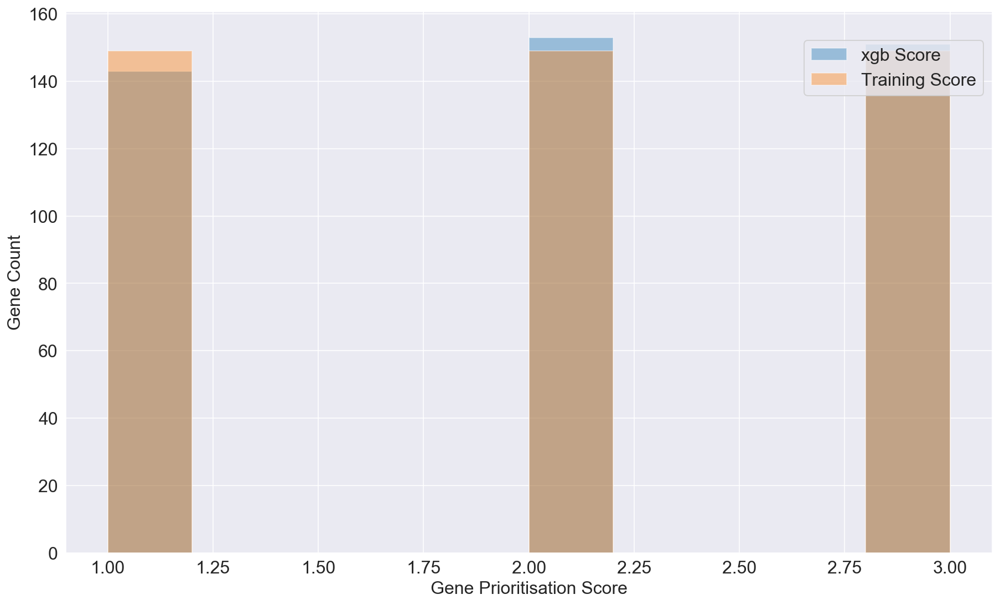

In [16]:
xgb.fit(X_train_borsel, Y_train_borsel)
predictions = list(xgb.predict(X_boruta_sel))

output = pd.Series(data=predictions, index=X_boruta_sel.index, name="xgb_Score")

df_total_training = pd.concat([X_boruta_sel, output], axis=1)

df_total = pd.concat([X_boruta_sel, output], axis=1)

fig, ax = plt.subplots()

sns.distplot(df_total["xgb_Score"], ax=ax, kde=False, norm_hist=False, bins=10)
sns.distplot(Y, ax=ax, kde=False, bins=10)
fig.legend(
    labels=["xgb Score", "Training Score"],
    loc="upper right",
    bbox_to_anchor=(0.83, 0.8),
    ncol=1,
    fontsize=16,
)
ax.set_xlabel("Gene Prioritisation Score", fontsize=16)
ax.set_ylabel("Gene Count", fontsize=16)
ax.tick_params(labelsize=16)

In [18]:
predictions = list(xgb.predict(X_boruta_sel))

output = pd.Series(data=predictions, index=X_boruta_sel.index, name="xgb_Score")

output = output.to_frame()
output.reset_index(level=0, inplace=True)

output

,Gene,xgb_Score
0,ABCC9,1
1,AC020983.5,3
2,AC093677.1,3
3,AC097374.4,3
4,AC103563.2,3
...,...,...
442,NaN,3
443,NaN,3
444,NaN,3
445,NaN,3


In [19]:
print(data[["Gene", "BPlabel_encoded"]])

df_b = data[["BPlabel_encoded"]]

df_c = pd.concat([output, df_b], axis=1)
df_c

           Gene  BPlabel_encoded
0         ABCC9                1
1    AC020983.5                3
2    AC093677.1                3
3    AC097374.4                3
4    AC103563.2                3
..          ...              ...
238       VAMP2                2
239         VDR                2
240       VEGFA                1
241        YES1                2
242       ZAP70                2

[243 rows x 2 columns]


,Gene,xgb_Score,BPlabel_encoded
0,ABCC9,1,1.0
1,AC020983.5,3,3.0
2,AC093677.1,3,3.0
3,AC097374.4,3,3.0
4,AC103563.2,3,3.0
...,...,...,...
442,NaN,3,NaN
443,NaN,3,NaN
444,NaN,3,NaN
445,NaN,3,NaN


### SHAP Feature Importance Visualization:

In [20]:
xgb.fit(X_train_borsel, Y_train_borsel)
df3 = pd.DataFrame(data=X_boruta_sel, columns=X_boruta_sel.columns)
df3.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X_boruta_sel.columns.values
]
X_importance = X_test_borsel
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(X_importance)
X_importance = pd.DataFrame(data=X_test_borsel, columns=df3.columns)

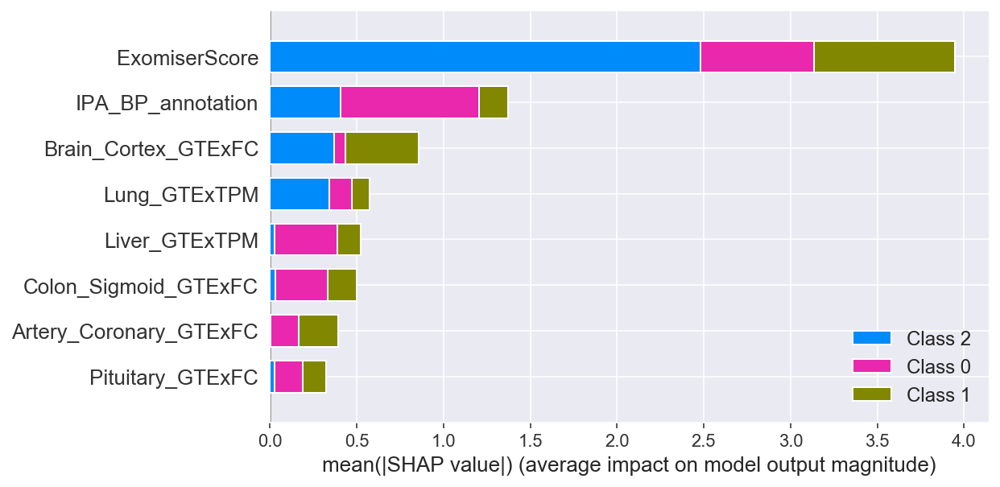

In [21]:
shap.summary_plot(shap_values, X_importance)

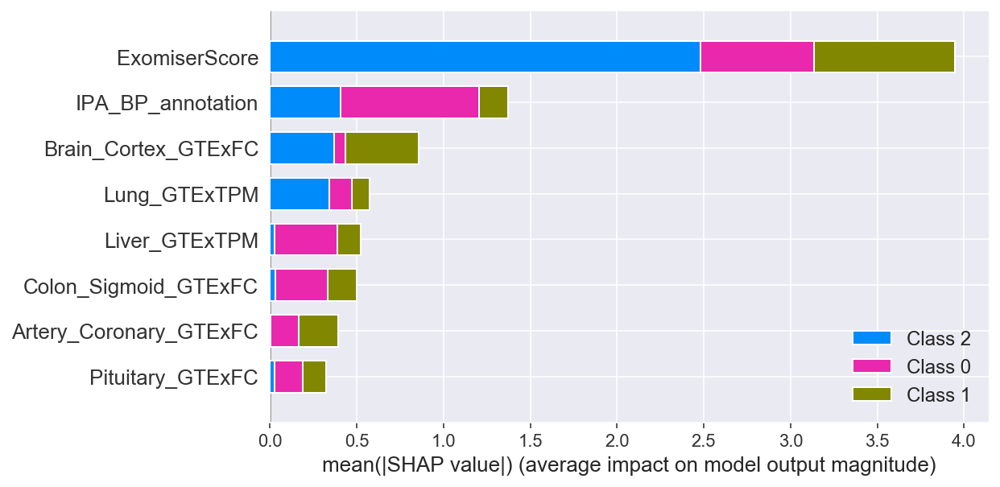

In [22]:
fig, ax = plt.subplots()
shap.summary_plot(shap_values, X_importance)
fig.savefig('oversample_shap_summary.svg', format='svg', dpi=1200, bbox_inches = "tight")

TypeError: only size-1 arrays can be converted to Python scalars

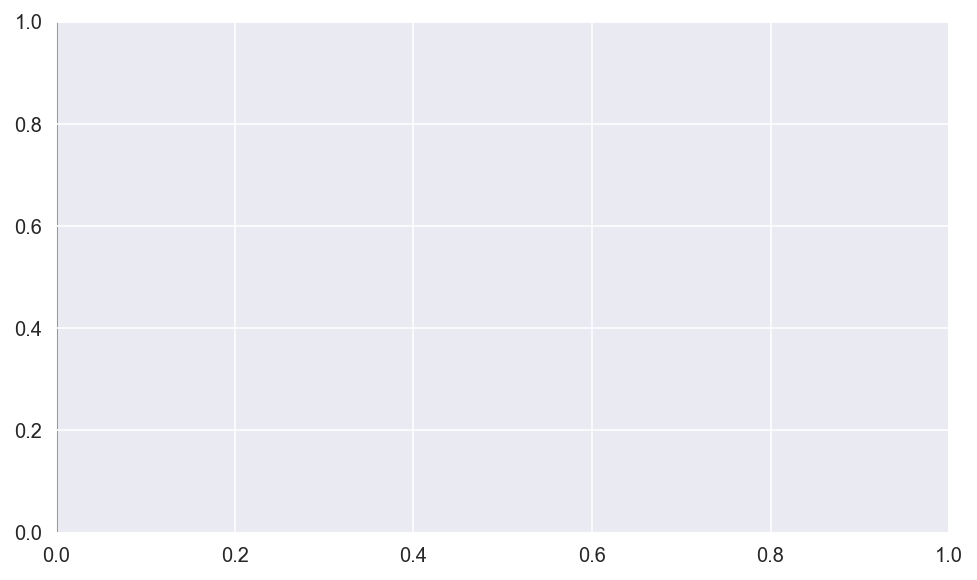

In [27]:
X_interaction = X_test_borsel
shap_interaction_values = shap.TreeExplainer(xgb).shap_interaction_values(X_interaction)
X_interaction2 = pd.DataFrame(data=X_interaction, columns=df3.columns)
shap.summary_plot(shap_interaction_values, X_interaction2, max_display=8)

In [28]:
shap.summary_plot(
    shap_interaction_values, X_interaction2, max_display=60, plot_type="compact_dot"
)

AssertionError: Only plot_type = 'bar' is supported for multi-output explanations!

In [32]:
X_interaction = X_test_borsel
shap_interaction_values = shap.TreeExplainer(xgb).shap_interaction_values(X_interaction)
tmp = np.abs(shap_interaction_values).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]


f = plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  # https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.yticks(
    range(tmp2.shape[0]),
    X_interaction.columns[inds],
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    X_interaction.columns[inds],
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.tight_layout()
f.savefig("shap_interactions.svg", format='svg', dpi=1200)


#plt.show()


IndexError: index 8 is out of bounds for axis 1 with size 8

In [33]:
shap.dependence_plot(
    "ExomiserScore", shap_values, X_importance, interaction_index="Artery_Coronary_GTExFC"
)

TypeError: The passed shap_values are a list not an array! If you have a list of explanations try passing shap_values[0] instead to explain the first output class of a multi-output model.

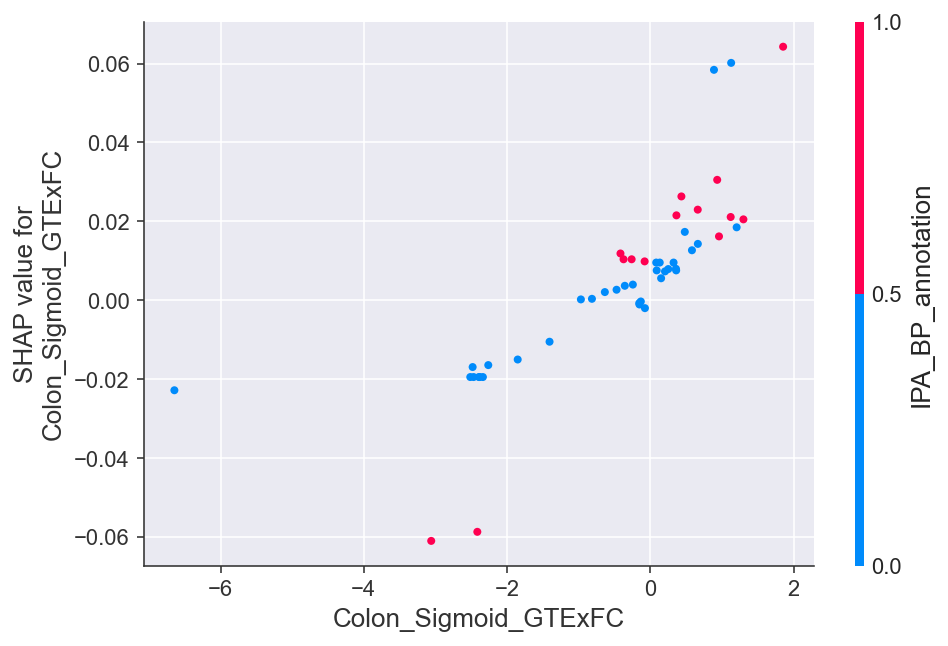

In [18]:
shap.dependence_plot(
    "Colon_Sigmoid_GTExFC", shap_values, X_importance, interaction_index="IPA_BP_annotation"
)

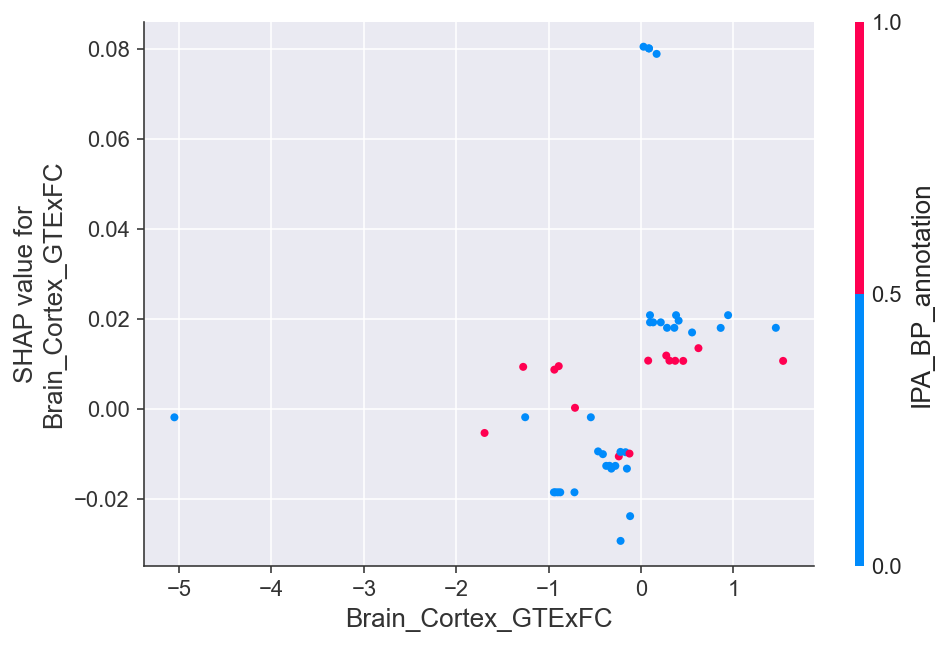

In [19]:
shap.dependence_plot(
    "Brain_Cortex_GTExFC", shap_values, X_importance, interaction_index="IPA_BP_annotation"
)

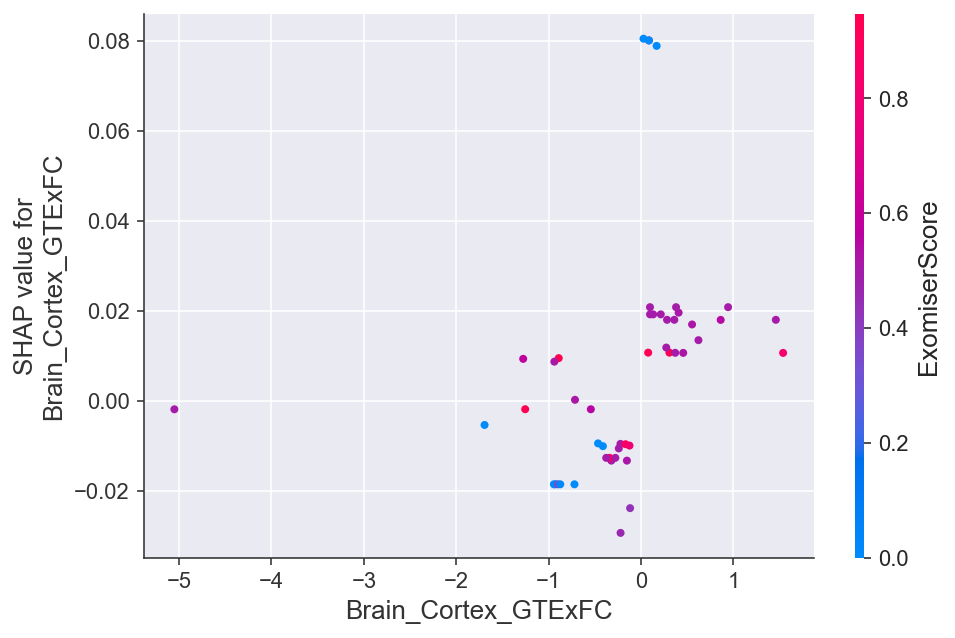

In [20]:
shap.dependence_plot(
    "Brain_Cortex_GTExFC", shap_values, X_importance, interaction_index="ExomiserScore"
)

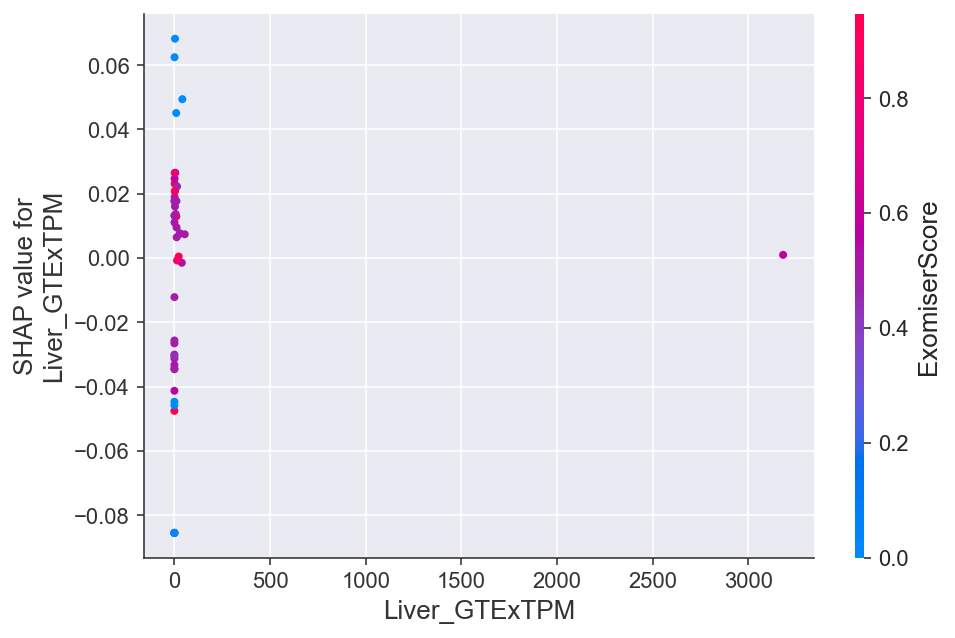

In [21]:
shap.dependence_plot(
    "Liver_GTExTPM", shap_values, X_importance, interaction_index="ExomiserScore"
)

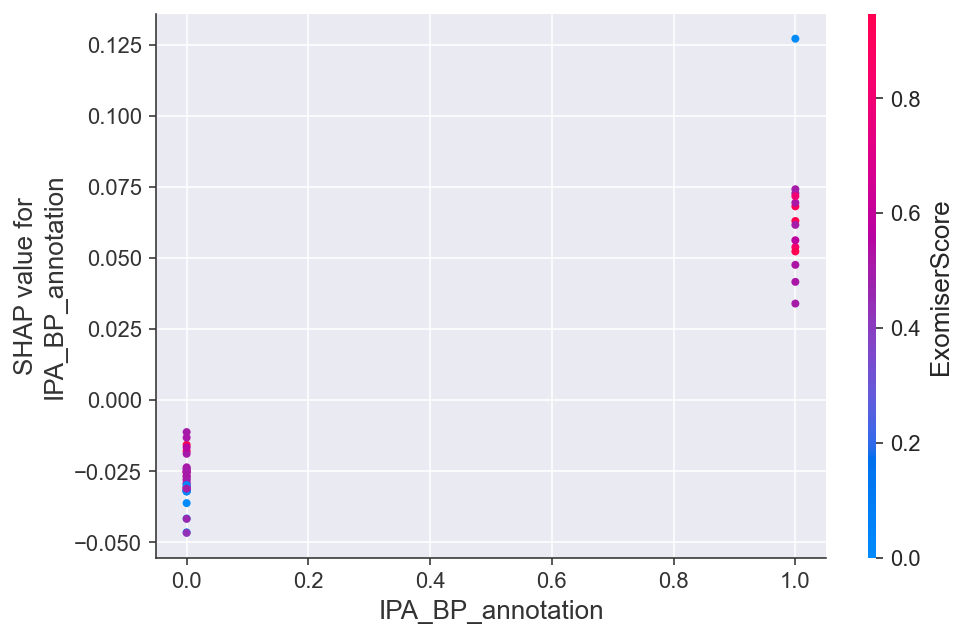

In [22]:
shap.dependence_plot(
    "IPA_BP_annotation", shap_values, X_importance, interaction_index="ExomiserScore"
)

In [34]:
expected_value = explainer.expected_value

if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

select = range(8)
features = X_test_borsel.iloc[select]


with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shap_values = explainer.shap_values(features)[1]
    shap_interaction_values = explainer.shap_interaction_values(features)
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

Explainer expected value: 0.7688820958137512


Exception: The hclust order only supports 2D arrays right now!

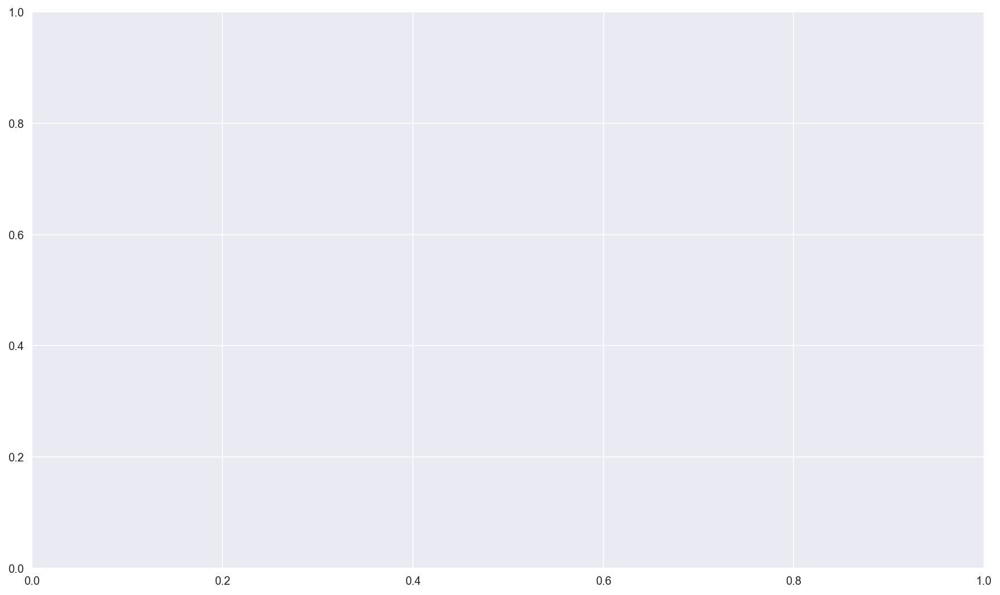

In [35]:
# https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/heatmap.html

shap_values = explainer(X_boruta_sel)
fig, ax = plt.subplots()
shap.plots.heatmap(shap_values)
fig.savefig('shap_heatmap.svg', format='svg', dpi=1200, bbox_inches = "tight")

In [37]:
select = range(8)
features = X_boruta_sel.iloc[select]
features_display = X_boruta_sel.loc[features.index]
shap_values = explainer.shap_values(X_boruta_sel)


In [26]:
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:243, :],
    X_boruta_sel.iloc[:243, :],
    features_display,
)

In [27]:
output_of_force_plot = shap.force_plot(
    explainer.expected_value,
    shap_values[:243, :],
    X_boruta_sel.iloc[:243, :],
    features_display,
    show=False,
)
file = "force_plot_pval07.html"
shap.save_html(file, output_of_force_plot)

### SHAP average measures per gene and per feature:

In [28]:
explainer = shap.Explainer(xgb, X_boruta_sel)
shap_values2 = explainer.shap_values(X_boruta_sel)
features = X_boruta_sel.columns.values.tolist()

shapdf = pd.DataFrame(data=np.array(shap_values2), columns=features)
shapdf["shap_average"] = shapdf.mean(axis=1)
shapdf

,Pituitary_GTExFC,Lung_GTExTPM,Liver_GTExTPM,IPA_BP_annotation,ExomiserScore,Brain_Cortex_GTExFC,Artery_Coronary_GTExFC,Colon_Sigmoid_GTExFC,shap_average
0,0.017438,0.004271,0.025019,0.074230,0.088905,0.009543,0.018694,0.025308,0.032926
1,0.012085,-0.018575,-0.082806,-0.025253,-0.308894,-0.031089,-0.043553,-0.026456,-0.065568
2,0.002454,-0.010039,0.027533,-0.032433,-0.352806,-0.044393,-0.049140,-0.005860,-0.058085
3,0.002454,-0.010039,0.023589,-0.032314,-0.349141,-0.044393,-0.049140,-0.005700,-0.058085
4,-0.017668,-0.016791,-0.076552,-0.025475,-0.315713,-0.026157,-0.033603,-0.022878,-0.066855
...,...,...,...,...,...,...,...,...,...
238,0.004057,0.006812,0.021153,-0.017421,0.115577,-0.017224,-0.009034,0.005776,0.013712
239,-0.062081,0.004679,-0.013558,0.064375,0.116170,-0.001346,0.009476,0.008413,0.015766
240,-0.008628,0.008042,0.018660,0.068534,0.102264,0.008749,0.013260,0.007219,0.027262
241,0.005593,-0.000872,0.018729,-0.015668,0.090999,0.018379,0.012451,0.006226,0.016980


In [33]:
df_d = pd.concat([df_c, shapdf], axis=1)
df_d.to_csv("2021-07-18_training_features_shapavg.csv", index=False)
df_d

,Gene,xgb_Score,BPlabel_encoded,Pituitary_GTExFC,Lung_GTExTPM,Liver_GTExTPM,IPA_BP_annotation,ExomiserScore,Brain_Cortex_GTExFC,Artery_Coronary_GTExFC,Colon_Sigmoid_GTExFC,shap_average
0,ABCC9,0.914859,1.00,0.017438,0.004271,0.025019,0.074230,0.088905,0.009543,0.018694,0.025308,0.032926
1,AC020983.5,0.126907,0.10,0.012085,-0.018575,-0.082806,-0.025253,-0.308894,-0.031089,-0.043553,-0.026456,-0.065568
2,AC093677.1,0.186767,0.10,0.002454,-0.010039,0.027533,-0.032433,-0.352806,-0.044393,-0.049140,-0.005860,-0.058085
3,AC097374.4,0.186767,0.10,0.002454,-0.010039,0.023589,-0.032314,-0.349141,-0.044393,-0.049140,-0.005700,-0.058085
4,AC103563.2,0.116612,0.10,-0.017668,-0.016791,-0.076552,-0.025475,-0.315713,-0.026157,-0.033603,-0.022878,-0.066855
...,...,...,...,...,...,...,...,...,...,...,...,...
238,VAMP2,0.761147,0.75,0.004057,0.006812,0.021153,-0.017421,0.115577,-0.017224,-0.009034,0.005776,0.013712
239,VDR,0.777577,0.75,-0.062081,0.004679,-0.013558,0.064375,0.116170,-0.001346,0.009476,0.008413,0.015766
240,VEGFA,0.869549,1.00,-0.008628,0.008042,0.018660,0.068534,0.102264,0.008749,0.013260,0.007219,0.027262
241,YES1,0.787287,0.75,0.005593,-0.000872,0.018729,-0.015668,0.090999,0.018379,0.012451,0.006226,0.016980


In [34]:
df_e = df_d[["Gene", "xgb_Score", "shap_average", "BPlabel_encoded"]]
df_e.to_csv("2021-07-18_training_genes_shapavg.csv", index=False)
df_e

,Gene,xgb_Score,shap_average,BPlabel_encoded
0,ABCC9,0.914859,0.032926,1.00
1,AC020983.5,0.126907,-0.065568,0.10
2,AC093677.1,0.186767,-0.058085,0.10
3,AC097374.4,0.186767,-0.058085,0.10
4,AC103563.2,0.116612,-0.066855,0.10
...,...,...,...,...
238,VAMP2,0.761147,0.013712,0.75
239,VDR,0.777577,0.015766,0.75
240,VEGFA,0.869549,0.027262,1.00
241,YES1,0.787287,0.016980,0.75


## Decision Plots:
- The plot is centered on the x-axis at explainer.expected_value. All SHAP values are relative to the model's expected value like a linear model's effects are relative to the intercept.
- The y-axis lists the model's features. By default, the features are ordered by descending importance. The importance is calculated over the observations plotted. _This is usually different than the importance ordering for the entire dataset._ In addition to feature importance ordering, the decision plot also supports hierarchical cluster feature ordering and user-defined feature ordering.
- Each observation's prediction is represented by a colored line. At the top of the plot, each line strikes the x-axis at its corresponding observation's predicted value. This value determines the color of the line on a spectrum.
- Moving from the bottom of the plot to the top, SHAP values for each feature are added to the model's base value. This shows how each feature contributes to the overall prediction.
- At the bottom of the plot, the observations converge at explainer.expected_value.

In [44]:
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel).iloc[1],
    features_display,
    ignore_warnings=True,
)

AttributeError: 'list' object has no attribute 'iloc'

In [14]:
X_boruta_sel = pd.read_csv("2021-07-18_selected_features_training_data.csv", header=0)
X_boruta_sel.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X_boruta_sel.columns.values
]

In [15]:
y_pred = xgb.predict(X_boruta_sel)

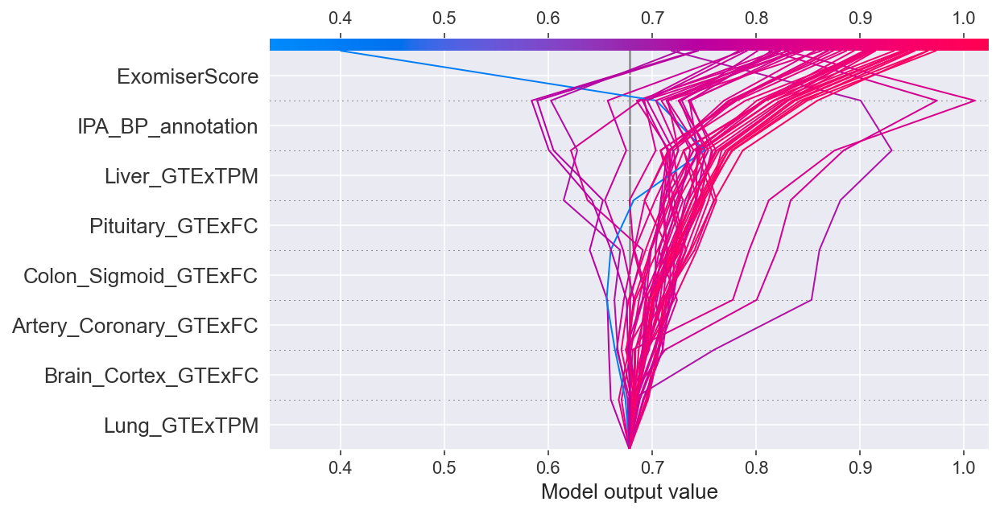

In [16]:
T = X_boruta_sel
T = T[(Y == 1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)

fig, ax = plt.subplots()
shap.decision_plot(expected_value, sh, T, return_objects=True)
fig.savefig('shap_51genes.svg', format='svg', dpi=1200, bbox_inches = "tight")


In [17]:
y_pred = xgb.predict(X_boruta_sel)
T = X_boruta_sel[(y_pred <= 0.6)]
T = T[(Y == 1)]
T.shape

(1, 8)

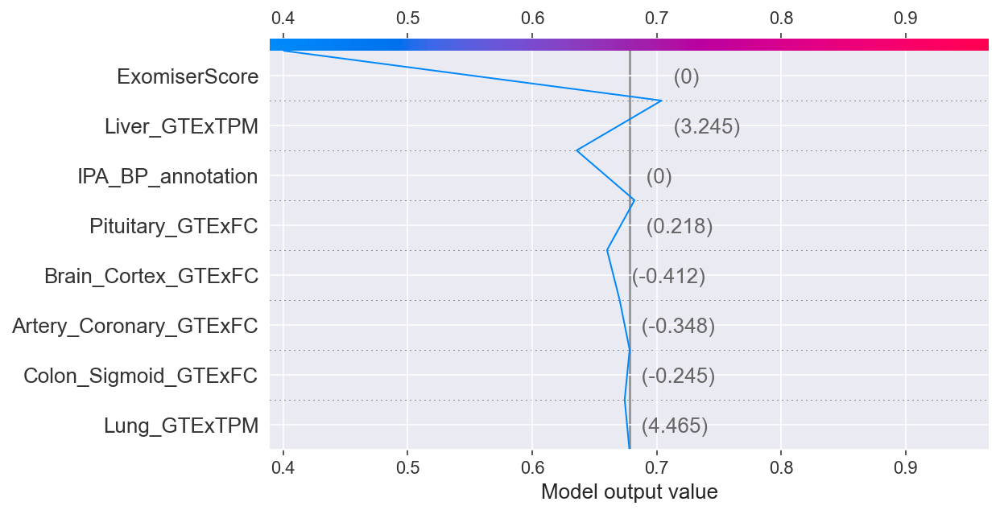

In [18]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)

r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [19]:
print(T)

    Pituitary_GTExFC  Lung_GTExTPM  Liver_GTExTPM  IPA_BP_annotation  \
90          0.218075       4.46479        3.24452                  0   

    ExomiserScore  Brain_Cortex_GTExFC  Artery_Coronary_GTExFC  \
90            0.0            -0.412119               -0.347885   

    Colon_Sigmoid_GTExFC  
90             -0.244719  


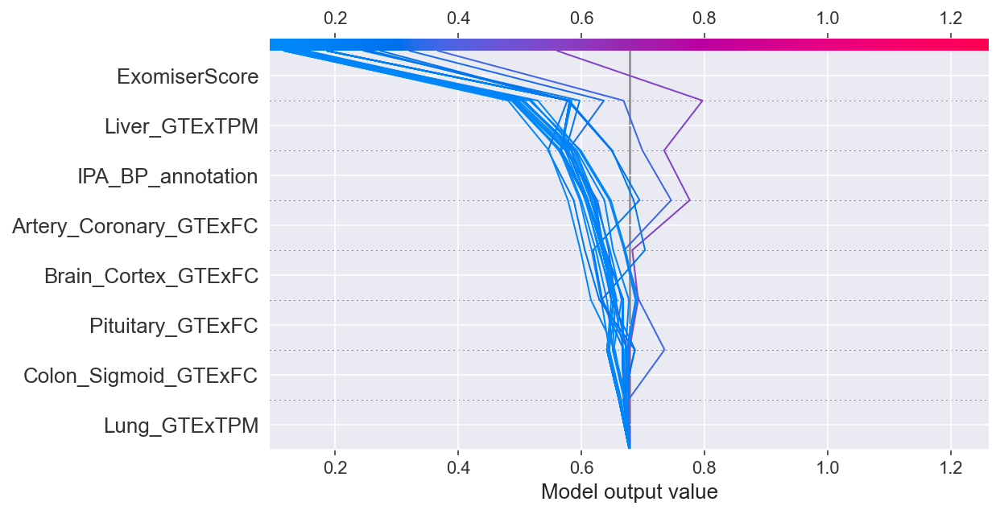

In [20]:
y_pred = xgb.predict(X_boruta_sel)
T = X_boruta_sel
T = T[(Y == 0.1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

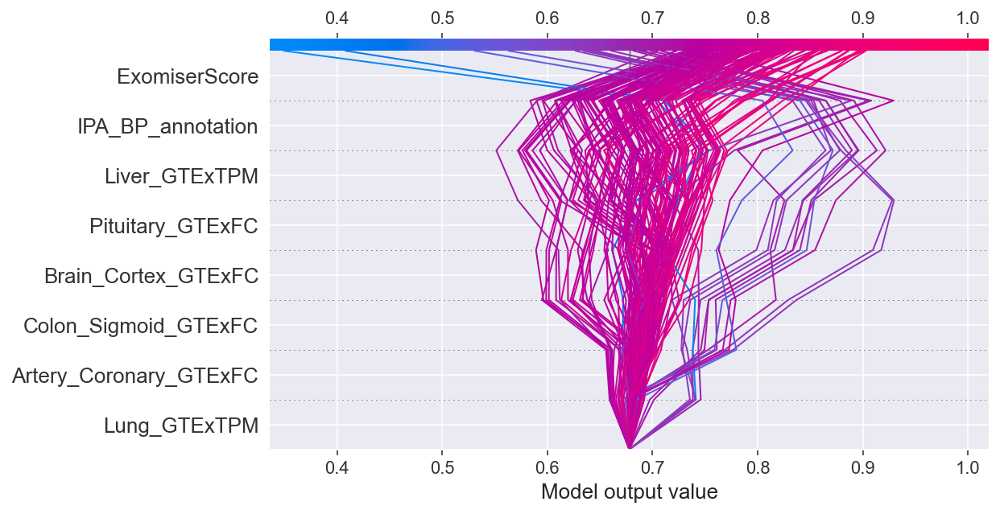

In [21]:
y_pred = xgb.predict(X_boruta_sel)
T = X_boruta_sel
T = T[(Y == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

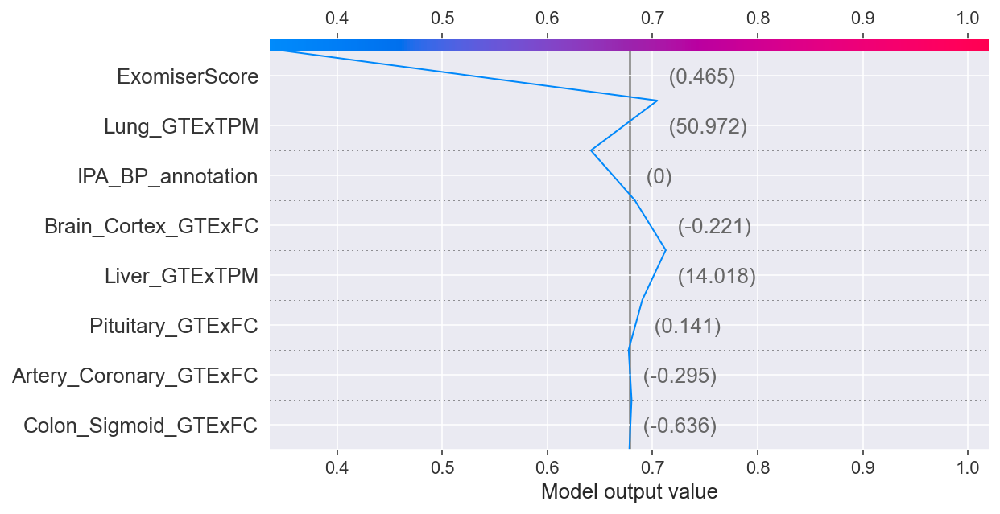

In [22]:
T = X_boruta_sel[(y_pred <= 0.4)]
T = T[(Y == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

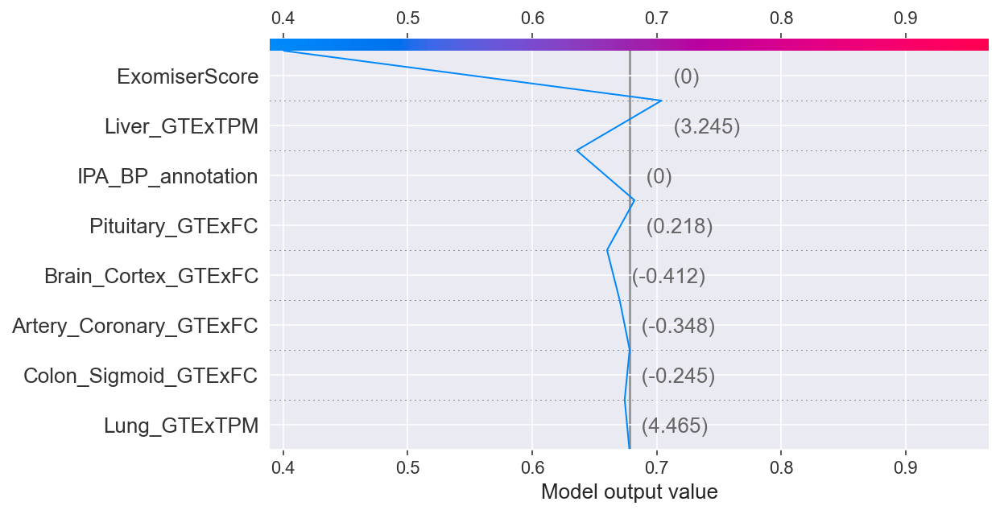

In [23]:
T = X_boruta_sel[(y_pred <= 0.5)]
T = T[(Y == 1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [24]:
print(T)

    Pituitary_GTExFC  Lung_GTExTPM  Liver_GTExTPM  IPA_BP_annotation  \
90          0.218075       4.46479        3.24452                  0   

    ExomiserScore  Brain_Cortex_GTExFC  Artery_Coronary_GTExFC  \
90            0.0            -0.412119               -0.347885   

    Colon_Sigmoid_GTExFC  
90             -0.244719  


In [25]:
X_boruta_sel = pd.read_csv("2021-07-18_selected_features_training_data.csv", header=0)
X_boruta_sel.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X_boruta_sel.columns.values
]
df_gene = data[["Gene"]]

X_boruta_sel = pd.concat([df_gene, X_boruta_sel], axis=1)

X_boruta_sel = X_boruta_sel.set_index("Gene")

X_boruta_sel.iloc[65]

Pituitary_GTExFC            -0.402815
Lung_GTExTPM              1325.710000
Liver_GTExTPM              422.046000
IPA_BP_annotation            1.000000
ExomiserScore                0.913255
Brain_Cortex_GTExFC         -3.749093
Artery_Coronary_GTExFC       0.529133
Colon_Sigmoid_GTExFC         0.671661
Name: DUSP1, dtype: float64

In [26]:
X_boruta_sel.iloc[[90], :]

,Pituitary_GTExFC,Lung_GTExTPM,Liver_GTExTPM,IPA_BP_annotation,ExomiserScore,Brain_Cortex_GTExFC,Artery_Coronary_GTExFC,Colon_Sigmoid_GTExFC
Gene,,,,,,,,
HFE,0.218075,4.46479,3.24452,0,0.0,-0.412119,-0.347885,-0.244719


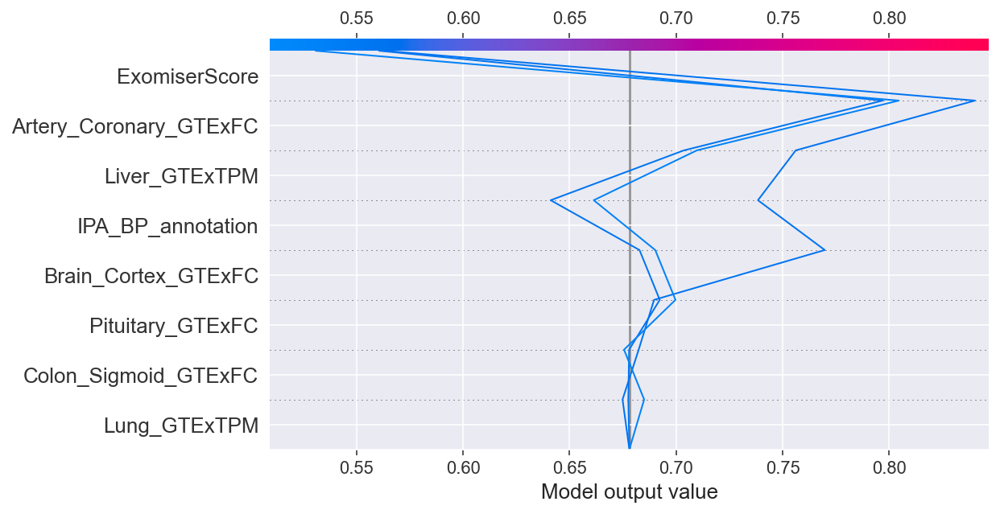

In [27]:
y_pred = xgb.predict(X_boruta_sel)

T = X_boruta_sel[(y_pred >= 0.5) & (y_pred <= 0.6)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [28]:
predictions = list(xgb.predict(X_boruta_sel))

output = pd.Series(data=predictions, index=X_boruta_sel.index, name="xgb_Score")

output = output.to_frame()
output.reset_index(level=0, inplace=True)

output

df_b = data[["BPlabel_encoded"]]

df_c = pd.concat([output, df_b], axis=1)
df_c

,Gene,xgb_Score,BPlabel_encoded
0,ABCC9,0.914859,1.00
1,AC020983.5,0.126907,0.10
2,AC093677.1,0.186767,0.10
3,AC097374.4,0.186767,0.10
4,AC103563.2,0.116612,0.10
...,...,...,...
238,VAMP2,0.761147,0.75
239,VDR,0.777577,0.75
240,VEGFA,0.869549,1.00
241,YES1,0.787287,0.75


In [29]:
list(X_boruta_sel.index).index("ACBD4")

5

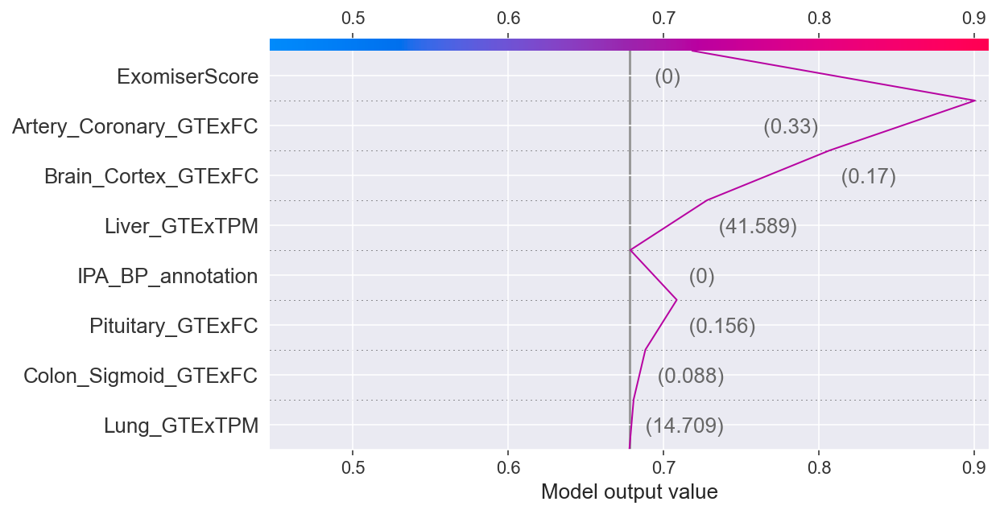

In [31]:
#ACBD4
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel.iloc[[5]]),
    X_boruta_sel.iloc[5],
    list(features_display,),
    return_objects=True
)

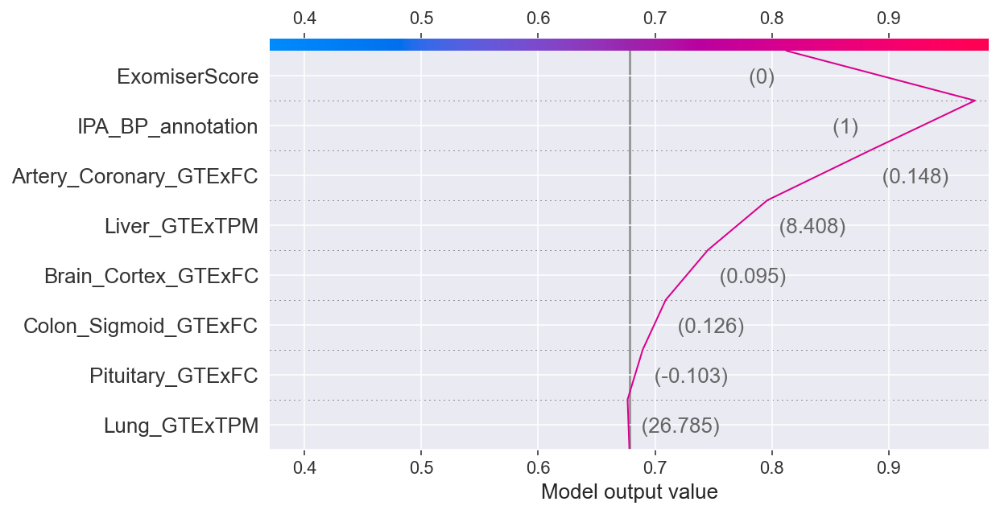

In [32]:
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel.iloc[[41]]),
    X_boruta_sel.iloc[41],
    list(features_display),
)
#CLCN6

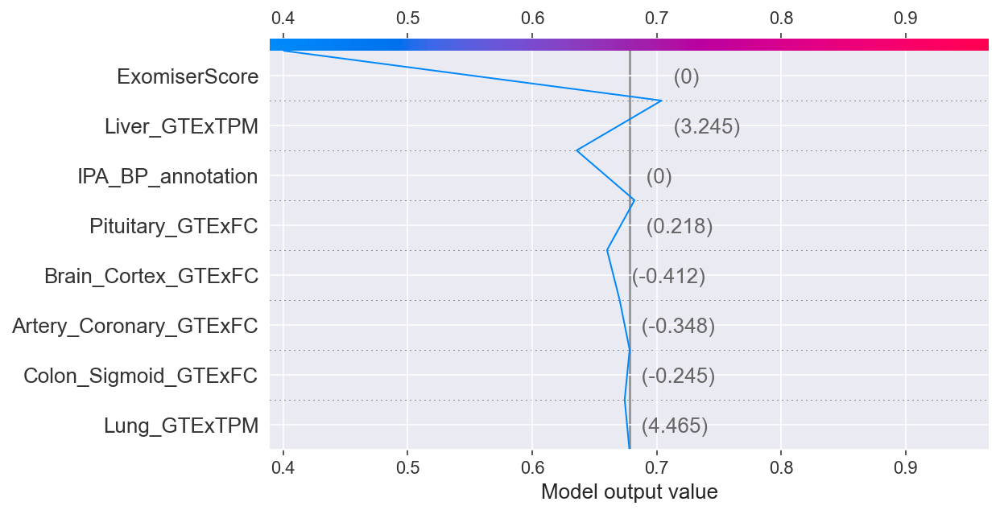

In [34]:
#HFE
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel.iloc[[90]]),
    X_boruta_sel.iloc[90],
    list(features_display),
)

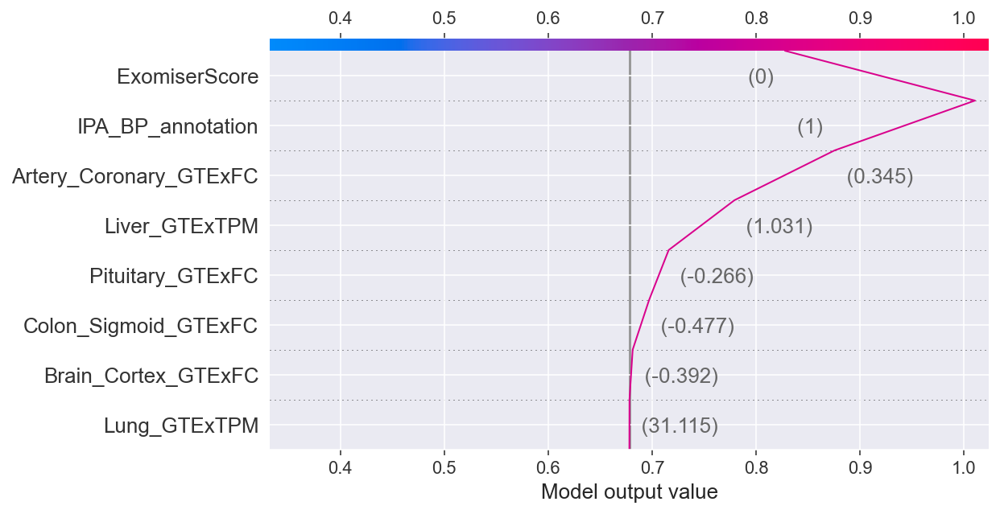

In [35]:
#EDNRA
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel.iloc[[68]]),
    X_boruta_sel.iloc[68],
    list(features_display),
)

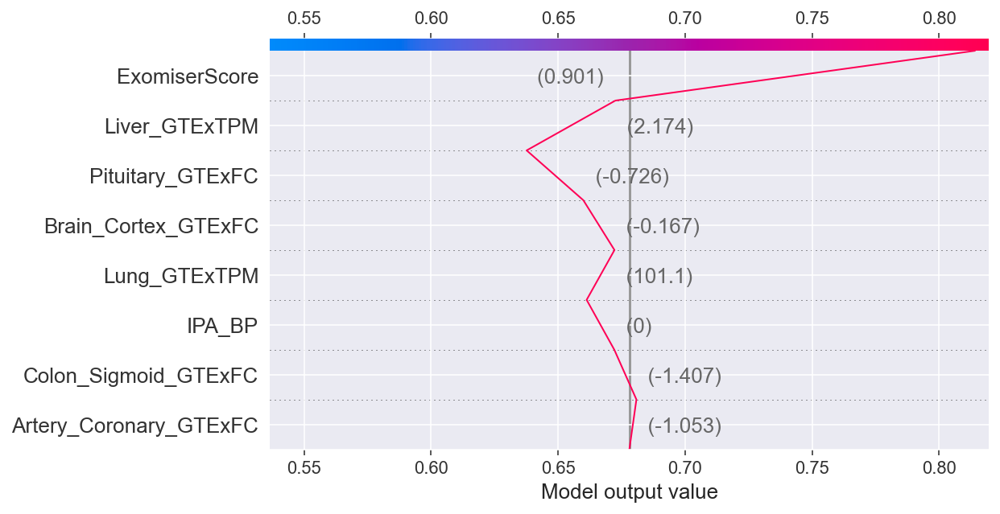

In [55]:
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel.iloc[83]),
    X_boruta_sel.iloc[83],
    list(features_display),
)

## Decison Plots of Genes with no exomiser score

In [56]:
XY = X_boruta_sel
XY = XY.reset_index()
Y2 = Y.to_frame()
XY["Training_Score"] = Y2["BPlabel_encoded"]
lowEx = XY.loc[XY["ExomiserScore"] == 0]
lowEx

,Gene,Pituitary_GTExFC,Lung_GTExTPM,Liver_GTExTPM,IPA_BP,ExomiserScore,Brain_Cortex_GTExFC,Artery_Coronary_GTExFC,Colon_Sigmoid_GTExFC,Training_Score
5,ACBD4,0.155903,14.709300,41.588600,0.0,0.0,0.169534,0.329856,0.088092,1.00
7,ACTG1P3,-0.218870,2.541570,0.983033,0.0,0.0,-0.464271,0.824622,-0.815827,0.10
22,BDNF,-0.331336,1.171760,0.043415,1.0,0.0,-1.693179,1.946759,1.852603,0.75
23,BTF3L4P2,-0.668931,0.480531,0.145694,0.0,0.0,-0.509887,1.535745,-0.184580,0.10
38,CHCHD3P2,0.526333,0.000000,0.000000,0.0,0.0,-0.531806,-0.491752,-2.680114,0.10
40,CKS1BP5,0.447898,0.000000,0.000000,0.0,0.0,-1.133441,-0.780194,-2.337793,0.10
41,CLCN6,-0.103133,26.785400,8.408100,1.0,0.0,0.095092,0.148308,0.125877,1.00
47,CTB-167G5.3,0.445601,0.000000,0.000000,0.0,0.0,-1.059549,-0.929356,-2.337793,0.10
53,CYCSP4,-0.319752,0.000000,0.000000,0.0,0.0,-1.123830,-0.699691,-2.338829,0.10
66,DUTP3,0.477567,0.000000,0.000000,0.0,0.0,-1.052680,-0.727359,-2.465080,0.10


In [57]:
Y2 = lowEx["Training_Score"]
lowEx = lowEx.drop(["Training_Score", "Gene"], 1)

In [58]:
y_pred = xgb.predict(lowEx)

In [59]:
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(lowEx)
expected_value = explainer.expected_value

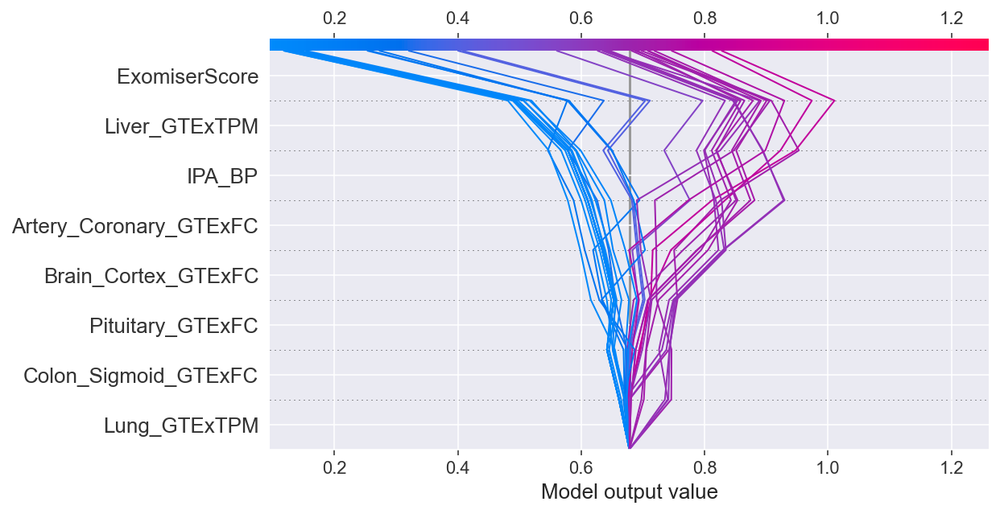

In [60]:
T = lowEx


with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

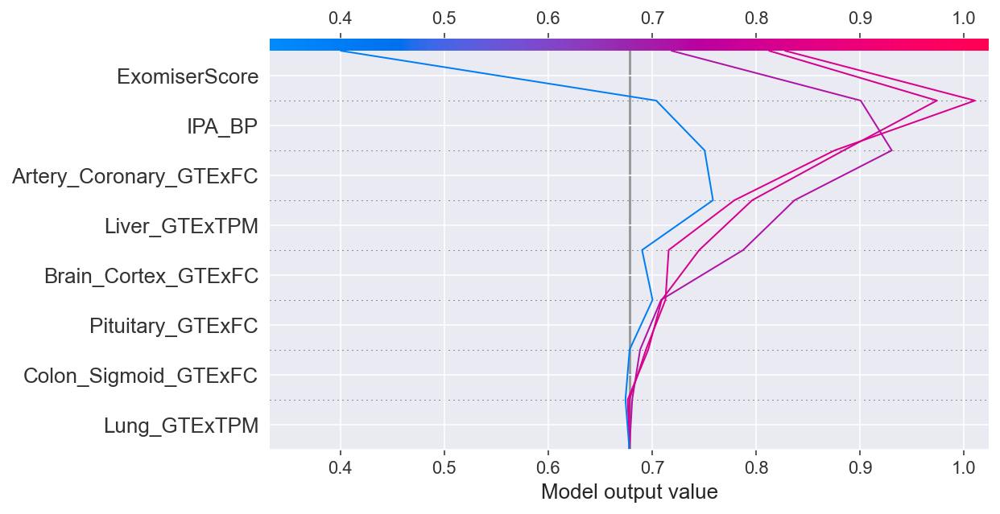

In [61]:
T = lowEx
T = T[(Y2 == 1.0)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

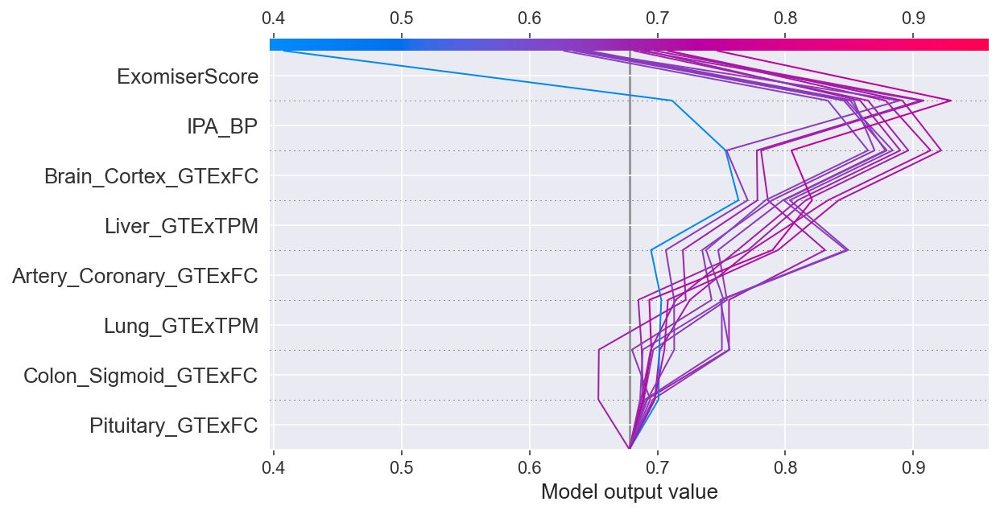

In [62]:
T = lowEx
T = T[(Y2 == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

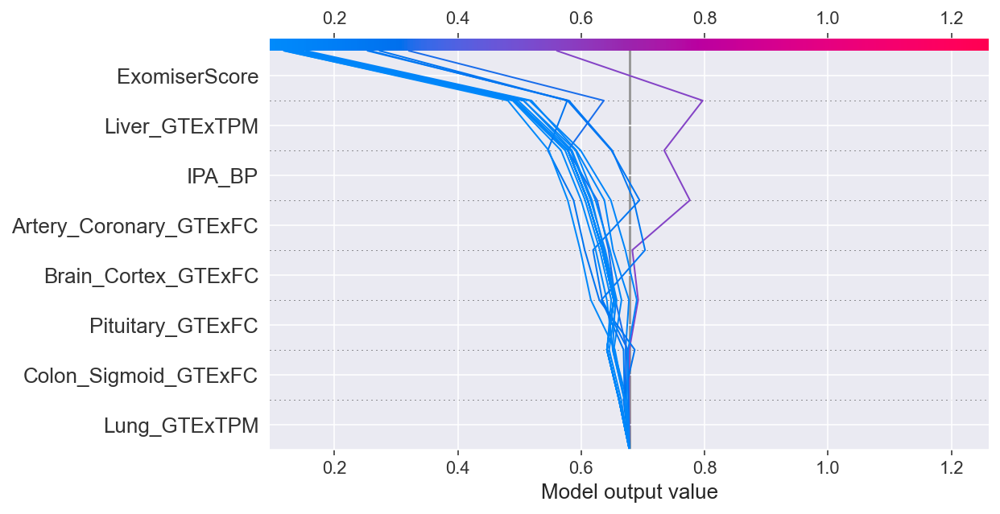

In [63]:
T = lowEx
T = T[(Y2 == 0.1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

## Unknown Gene Prediction

In [14]:
dataset_unknown = pd.read_csv("2021-07-18_pval07_BP_unknown.txt", sep="\t")

df2 = dataset_unknown[
    [
        "Pituitary_GTExFC",
        "Lung_GTExTPM",
        "Liver_GTExTPM",
        "IPA_BP_annotation",
        "ExomiserScore",
        "Brain_Cortex_GTExFC",
        "Artery_Coronary_GTExFC",
        "Colon_Sigmoid_GTExFC",
    ]
]

df2.shape

(1804, 8)

In [15]:
imputer = MissForest(random_state=seed)
df3 = imputer.fit_transform(df2)

Iteration: 0
Iteration: 1
Iteration: 2


In [16]:
X2 = pd.DataFrame(df3, index=df2.index, columns=df2.columns)

X2.shape

(1804, 8)

In [17]:
model = xgb
model.fit(X_boruta_sel, Y)
predictions = list(model.predict(X2))

output = pd.Series(data=predictions, index=dataset_unknown.index, name="xgb_Score")

df_total = pd.concat([dataset_unknown, output], axis=1)

In [18]:
df_total.nlargest(10, "xgb_Score", keep="last")

,Gene,REVEL.max,MetaSVM_rankscore.max,MetaLR_rankscore.max,MCAP.max,minP.min.min,minP.min.max,wgEncodeBroadHmmHuvecHMM.count,betamax,logpval_gwascatalog,...,GTEx_signif_sexbias,HIPred,IPA_BP_annotation,IPA_Activity,O_GlcNAc_Score,EMS_Max,PharmGKB_Score,ExAc_constraint_obs_exp,BPlabel,xgb_Score
1714,VCL,NaN,NaN,NaN,NaN,NaN,NaN,525,-0.4716,12.000000,...,NaN,0.639468,1,2,NaN,NaN,NaN,0.304247,unknown,0.925563
561,GCH1,NaN,NaN,NaN,NaN,NaN,NaN,496,-0.3323,15.698970,...,NaN,0.824708,1,2,NaN,NaN,NaN,NaN,unknown,0.911683
459,EIF2AK4,0.088,0.430,0.0,NaN,NaN,NaN,859,0.4011,49.698970,...,1.0,0.708683,1,0,NaN,NaN,0.0,0.920901,unknown,0.909966
476,ERAP1,0.243,0.539,0.0,NaN,NaN,NaN,60,-0.3677,375.000000,...,NaN,0.167413,1,2,0.256505,NaN,NaN,NaN,unknown,0.908386
201,C1GALT1,NaN,NaN,NaN,NaN,NaN,NaN,45,-0.3187,28.000000,...,1.0,0.451622,1,2,NaN,NaN,NaN,NaN,unknown,0.907541
828,MLLT3,NaN,NaN,NaN,NaN,NaN,NaN,156,0.5430,12.698970,...,1.0,0.824708,1,0,NaN,NaN,0.0,0.168365,unknown,0.906908
1607,TLN1,NaN,NaN,NaN,NaN,NaN,NaN,945,-0.5041,21.301030,...,1.0,0.801729,1,2,14.477714,NaN,NaN,0.460352,unknown,0.903387
175,BMPR1B,NaN,NaN,NaN,NaN,NaN,NaN,467,0.3888,12.000000,...,NaN,0.852899,1,0,NaN,NaN,NaN,1.020019,unknown,0.902245
611,HDAC9,NaN,NaN,NaN,NaN,NaN,NaN,46,-0.2720,282.522879,...,1.0,0.602501,1,1,NaN,NaN,NaN,NaN,unknown,0.900501
678,INSR,NaN,NaN,NaN,NaN,NaN,NaN,233,0.4183,58.000000,...,1.0,0.743839,1,0,6.200085,NaN,0.0,NaN,unknown,0.900069


In [19]:
df_file = df_total[["Gene", "xgb_Score"]]
df_file = df_file.nlargest(1804, "xgb_Score", keep="last")

### Model Prediction Distribution:

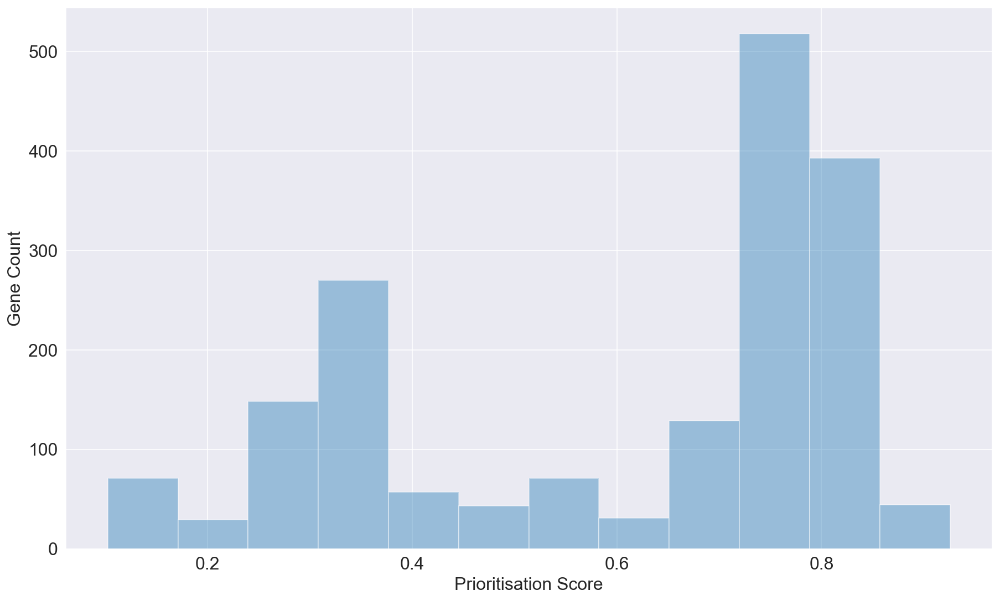

In [20]:
ax = sns.distplot(df_total["xgb_Score"], kde=False, norm_hist=False)
ax.set_xlabel("Prioritisation Score", fontsize=16)
ax.set_ylabel("Gene Count", fontsize=16)
ax.tick_params(labelsize=16)

### SHAP Feature Importance Visualization:

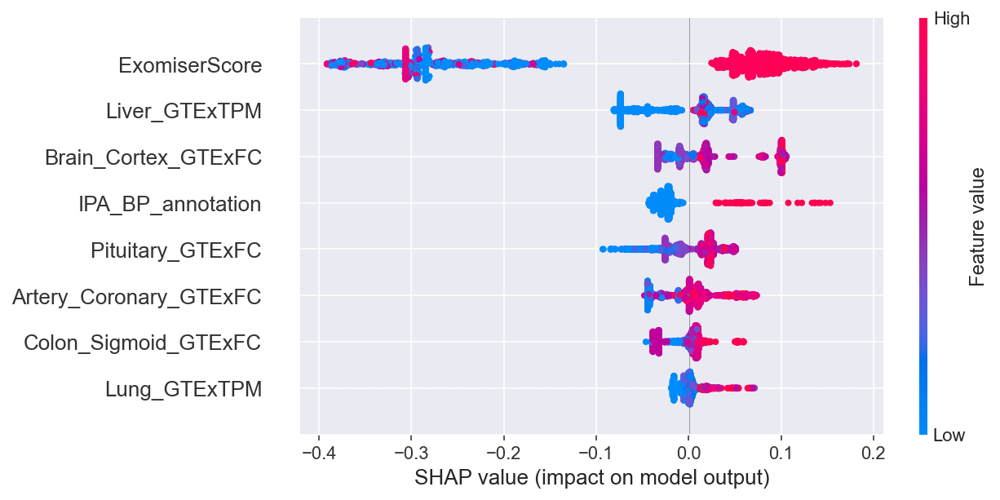

In [38]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X2)
shap.summary_plot(shap_values, X2)

In [39]:
expected_value = explainer.expected_value

In [43]:
select = range(8)
features = X2.iloc[select]
features_display = X2.loc[features.index]
shap_values = explainer.shap_values(X2)
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:1804, :],
    X2.iloc[:1804, :],
    features_display,
)

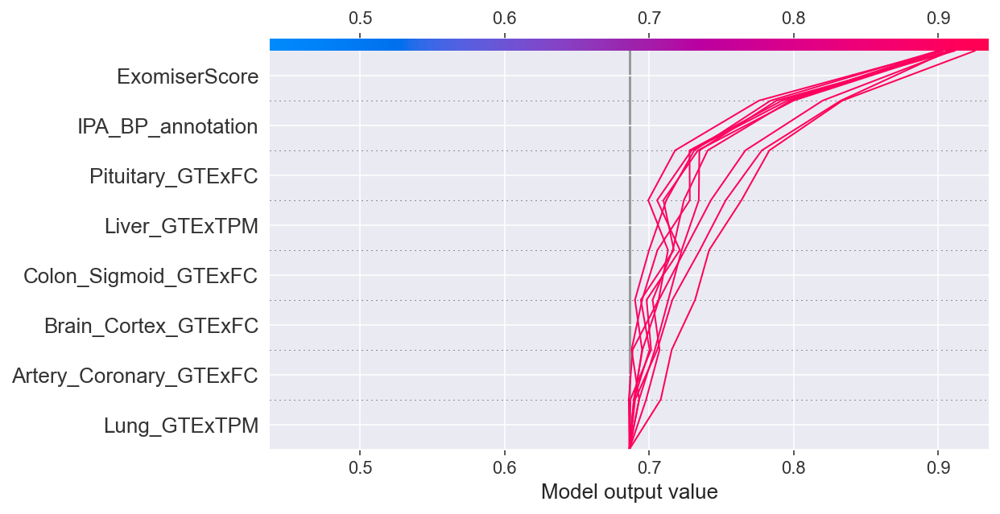

In [45]:
y_pred = model.predict(X2)

T = X2[(y_pred >= 0.900069)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [44]:
L=[1714, 561, 459, 476, 201, 828, 1607, 175, 611, 678]
X10 = X2.loc[L]

In [45]:
df10 = df_total.nlargest(10, "xgb_Score", keep="last")
df10 = df10 [[
        "Pituitary_GTExFC",
        "Lung_GTExTPM",
        "Liver_GTExTPM",
        "IPA_BP_annotation",
        "ExomiserScore",
        "Brain_Cortex_GTExFC",
        "Artery_Coronary_GTExFC",
        "Colon_Sigmoid_GTExFC",]]

In [46]:
select = range(8)
features = X10.iloc[select]
features_display = X10.loc[features.index]
shap_values = explainer.shap_values(X10)
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:10, :],
    X10.iloc[:10, :],
    features_display,
)

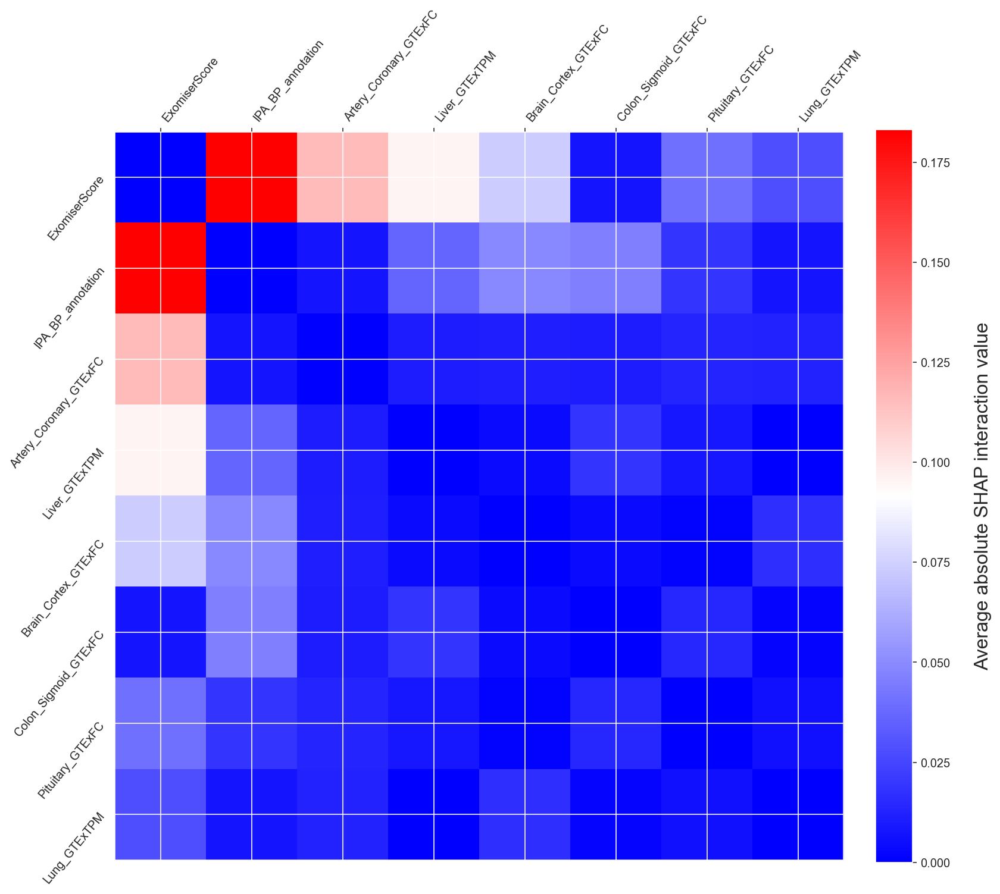

In [27]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X10)
X_interaction10 = pd.DataFrame(data=X10, columns=df10.columns)


tmp = np.abs(shap_interaction_values).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]
plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  # https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.yticks(
    range(tmp2.shape[0]),
    X_interaction10.columns[inds],
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    X_interaction10.columns[inds],
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.show()

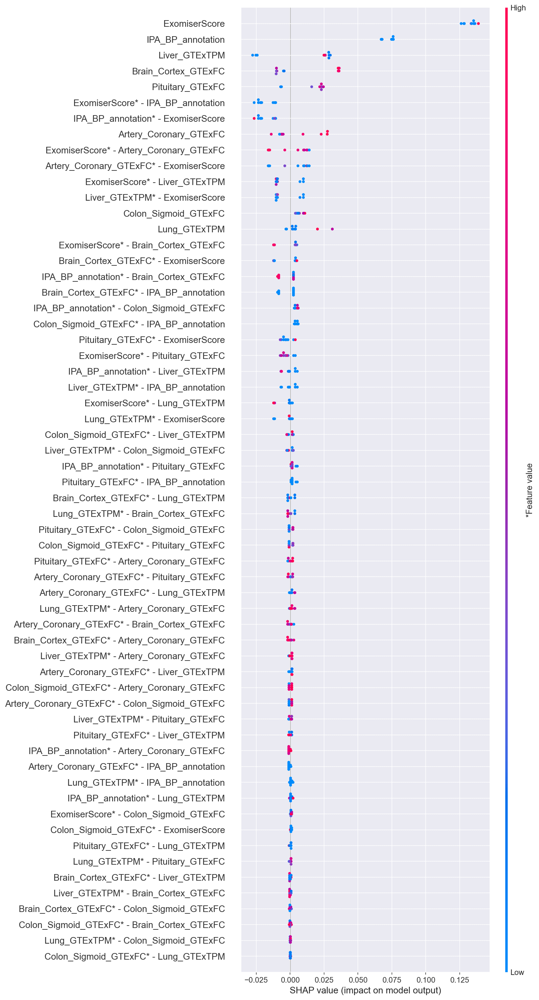

In [28]:
shap.summary_plot(
    shap_interaction_values, X10, max_display=60, plot_type="compact_dot"
)

In [29]:
shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(X2)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X2.iloc[[j]],
        feature_names=df2.columns,
    )
    return p


shap_plot(1714)

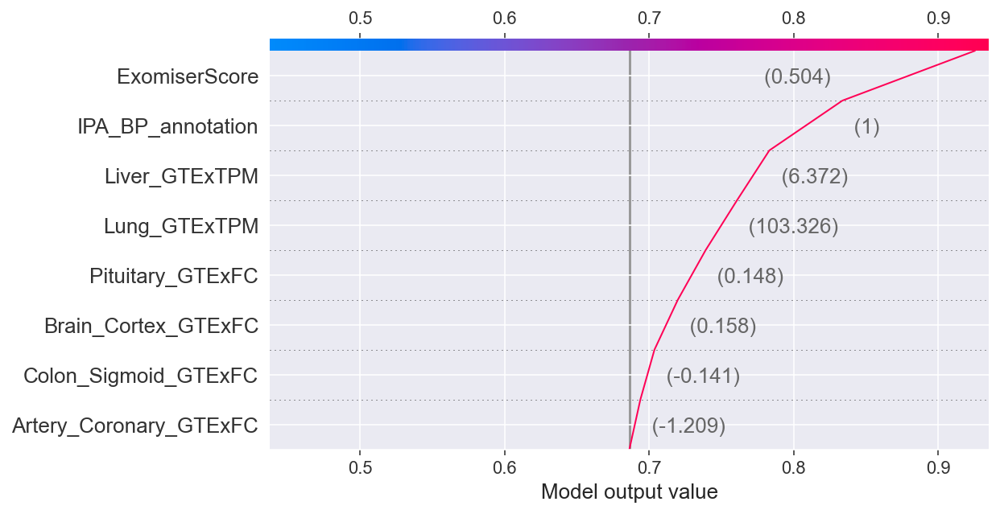

In [33]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value, shap_values[1714], X2.iloc[1714])

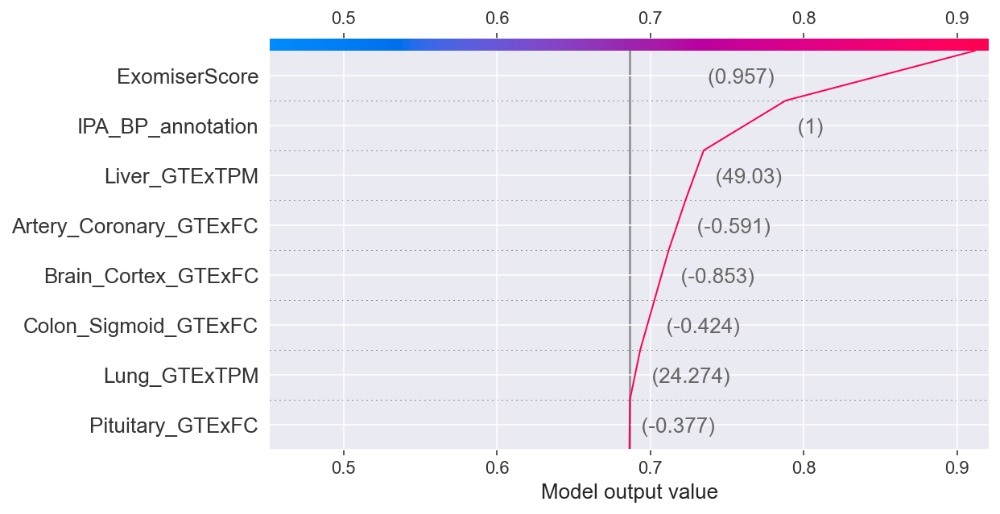

In [26]:
shap.decision_plot(expected_value, shap_values[561], X2.iloc[561])

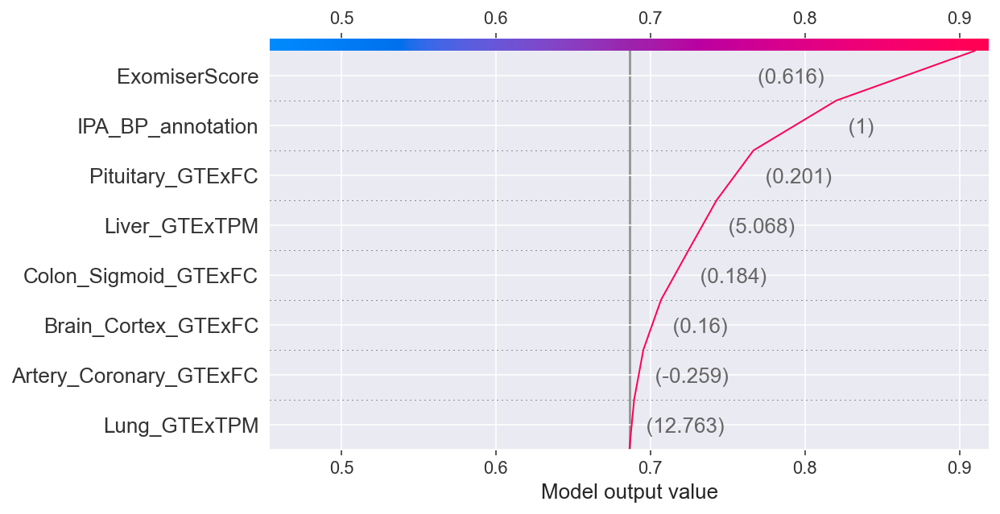

In [27]:
shap.decision_plot(expected_value, shap_values[459], X2.iloc[459])

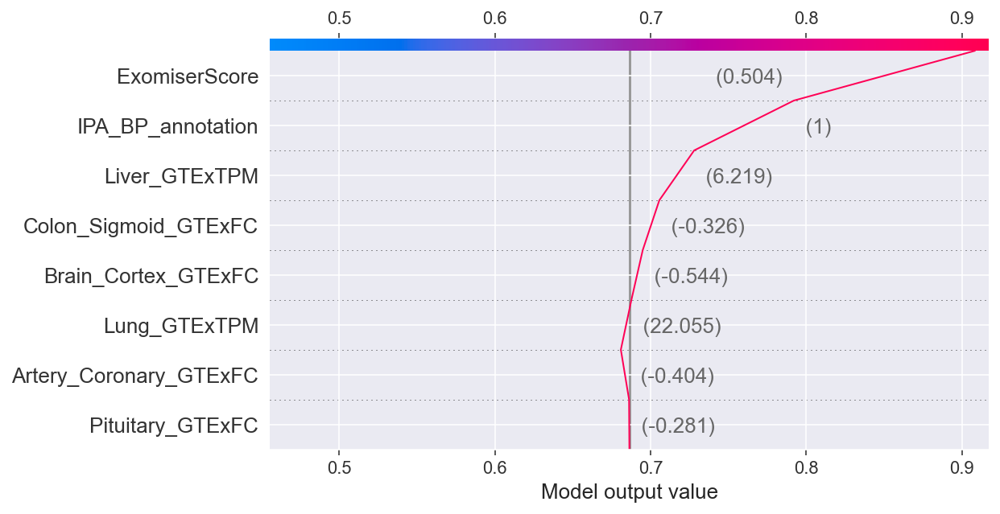

In [28]:
shap.decision_plot(expected_value, shap_values[476], X2.iloc[476])

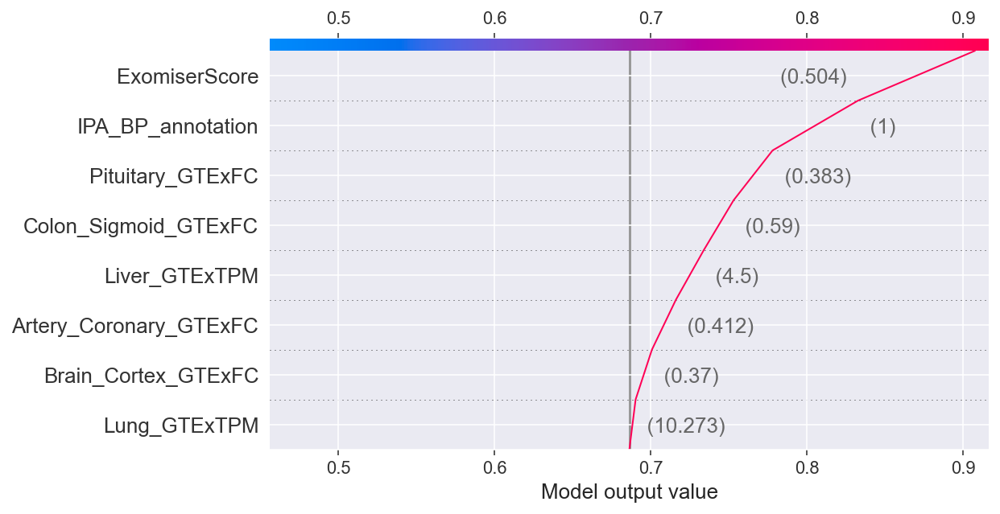

In [29]:
shap.decision_plot(expected_value, shap_values[201], X2.iloc[201])

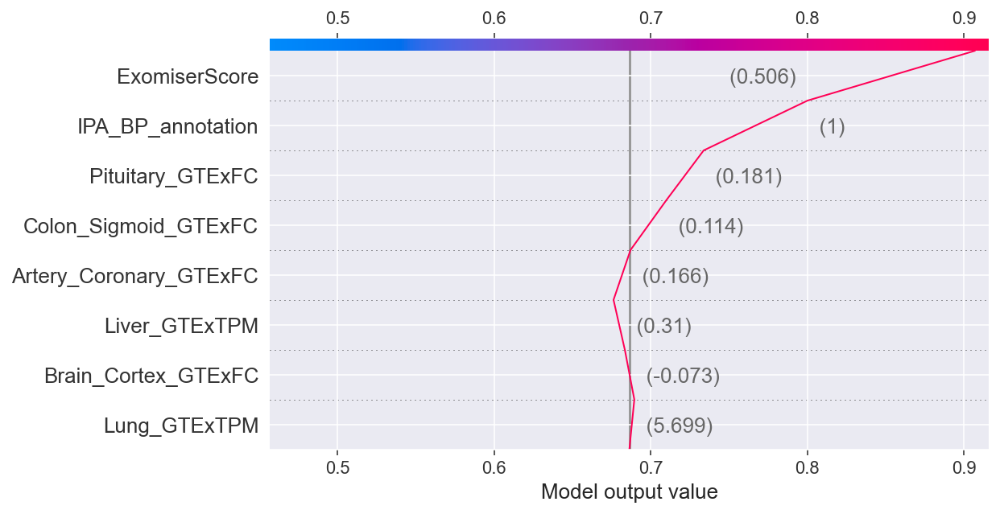

In [25]:
shap.decision_plot(expected_value, shap_values[828], X2.iloc[828])

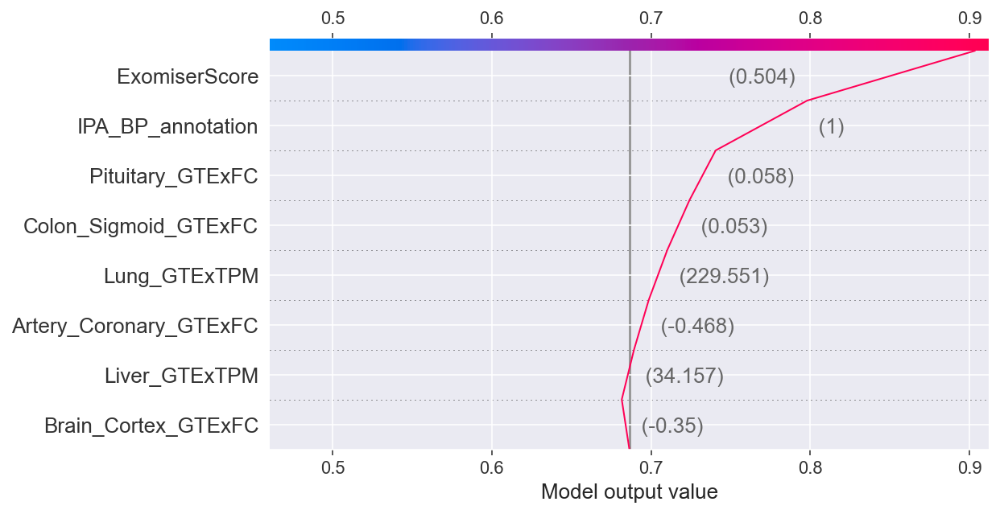

In [58]:
shap.decision_plot(expected_value, shap_values[1607], X2.iloc[1607])

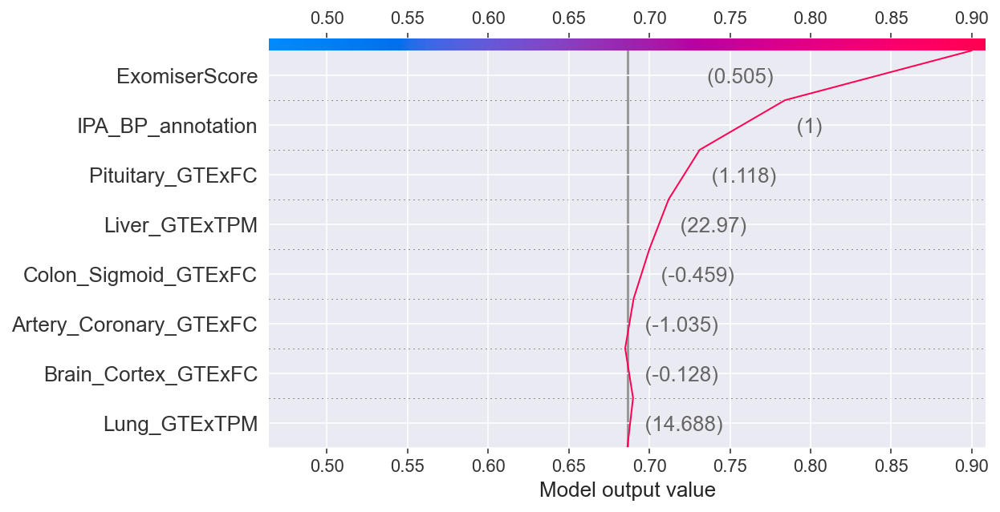

In [59]:
shap.decision_plot(expected_value, shap_values[678], X2.iloc[678])

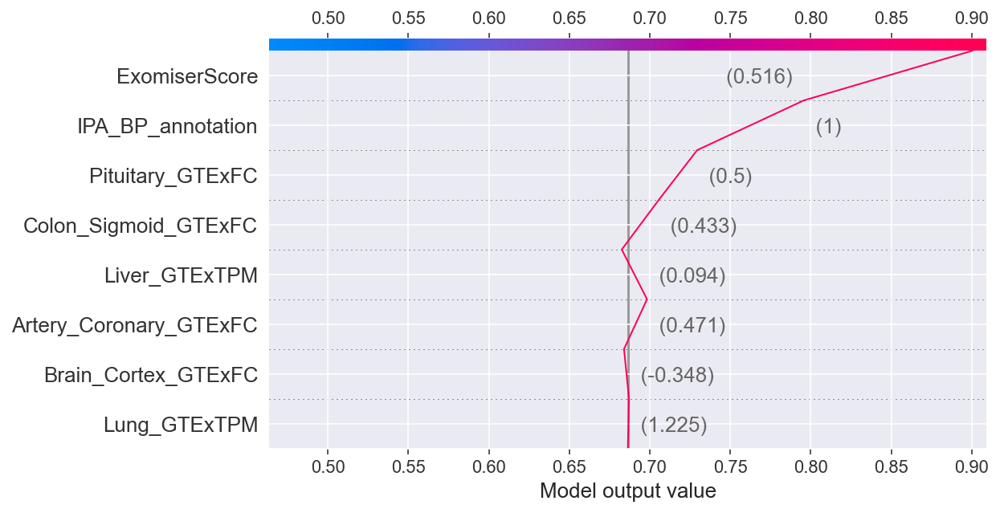

In [34]:
shap.decision_plot(expected_value, shap_values[611], X2.iloc[611])

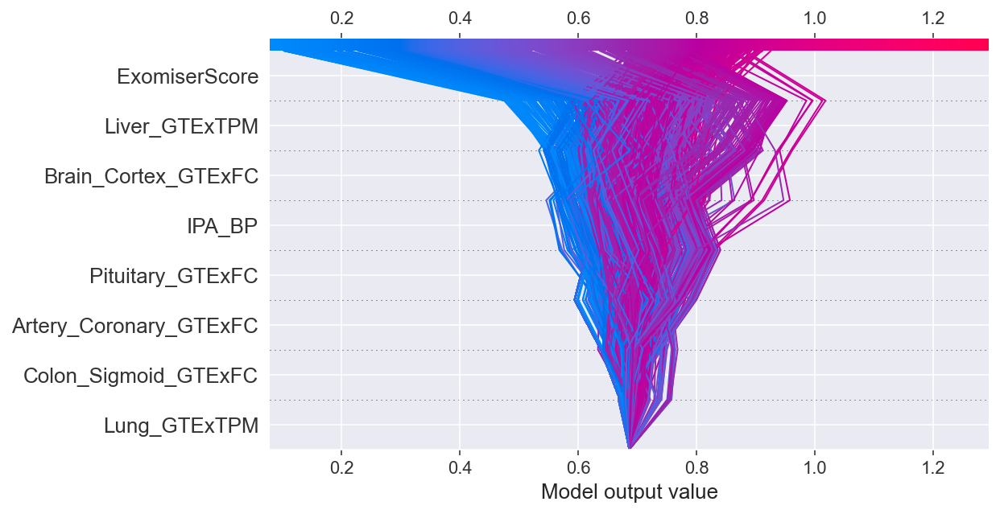

In [74]:
shap.decision_plot(expected_value, shap_values, X2)

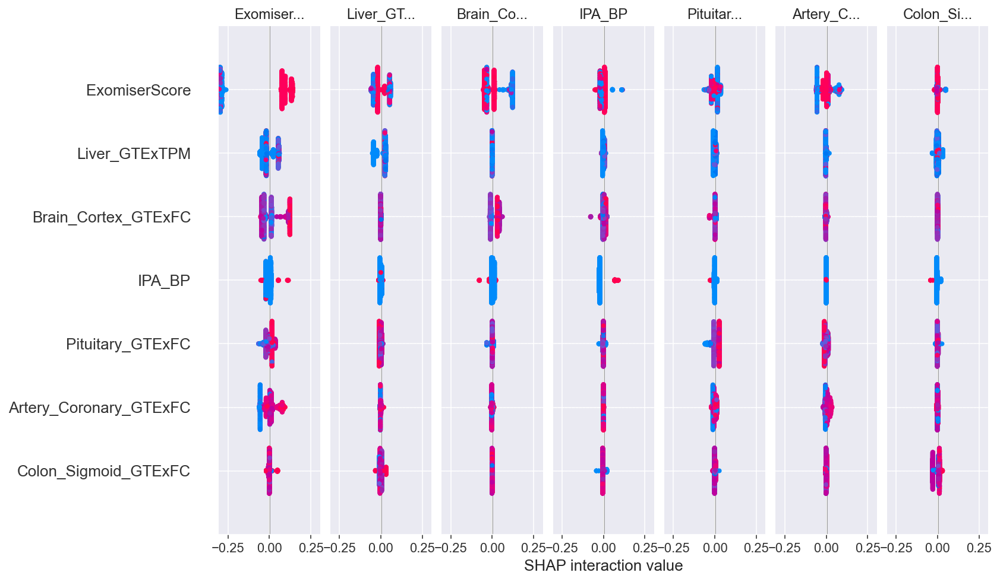

In [75]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X2)
X_interaction2 = pd.DataFrame(data=X2, columns=df2.columns)
shap.summary_plot(shap_interaction_values, X_interaction2)

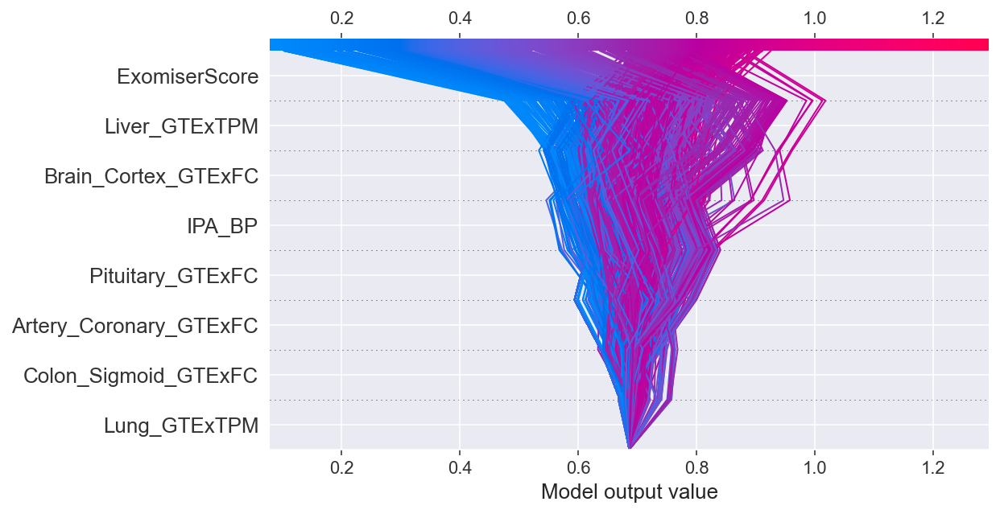

In [76]:
shap.decision_plot(expected_value, shap_values, features_display, ignore_warnings=True)

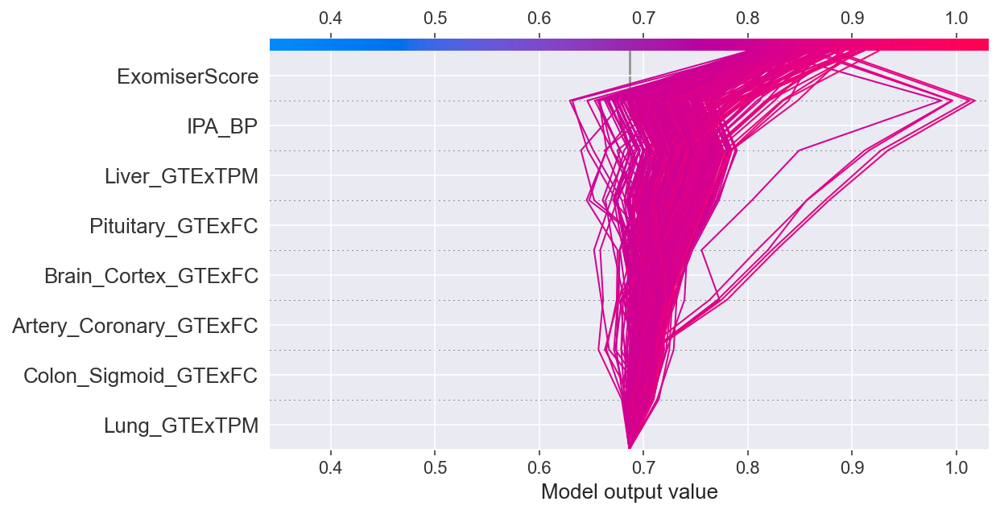

In [77]:
y_pred = xgb.predict(X2)
T = X2[(y_pred >= 0.8)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

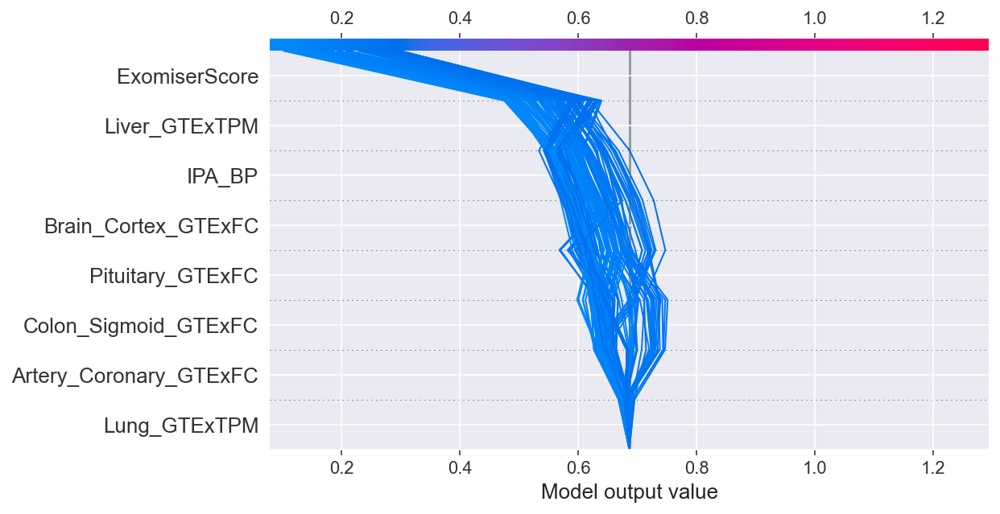

In [78]:
y_pred = xgb.predict(X2)
T = X2[(y_pred <= 0.3)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True, ignore_warnings=True)

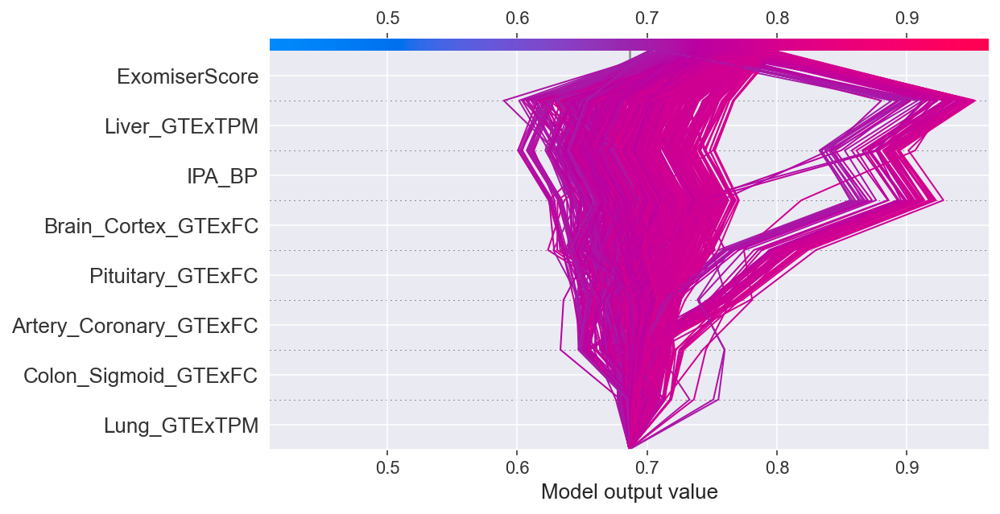

In [79]:
y_pred = xgb.predict(X2)
T = X2[(y_pred >= 0.7) & (y_pred <= 0.8)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [76]:
smallest = df_total.nsmallest(10, "xgb_Score", keep="last")

smallest[['Gene', 'xgb_Score']]

,Gene,xgb_Score
1692,UFL1-AS1,0.102440
1316,RP11-382A20.7,0.102650
372,CTD-2033A16.3,0.102650
778,LY6G6F,0.103893
1320,RP11-432I5.2,0.104274
1360,RP11-734C14.2,0.104419
67,AGBL4,0.105703
1744,YBX1P6,0.107079
1403,RPS20P2,0.107079
1285,RP11-283G6.4,0.107079


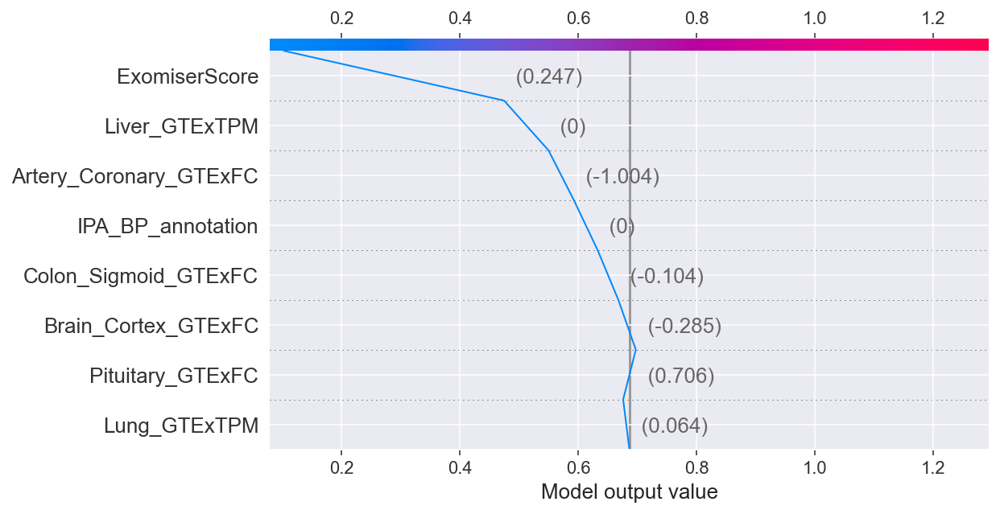

In [74]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value, shap_values[1692], X2.iloc[1692])

In [82]:
gene1 = df_total[df_total["Gene"].str.contains("SUGCT")]
print(gene1)

       Gene  REVEL.max  MetaSVM_rankscore.max  MetaLR_rankscore.max  MCAP.max  \
1561  SUGCT       0.08                    NaN                   NaN       NaN   

      minP.min.min  minP.min.max  wgEncodeBroadHmmHuvecHMM.count  betamax  \
1561           NaN           NaN                             153  -0.6445   

      logpval_gwascatalog  ...  GTEx_signif_sexbias    HIPred  IPA_BP  \
1561                 24.0  ...                  1.0  0.195843       0   

      IPA_Activity  O_GlcNAc_Score  EMS_Max  PharmGKB_Score  \
1561             0             NaN      NaN             2.5   

      ExAc_constraint_obs_exp  BPlabel  xgb_Score  
1561                      NaN  unknown   0.826467  

[1 rows x 143 columns]


In [83]:
X_importance = X2
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_importance)

shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(X2)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X2.iloc[[j]],
        feature_names=df2.columns,
    )
    return p


shap_plot(1561)

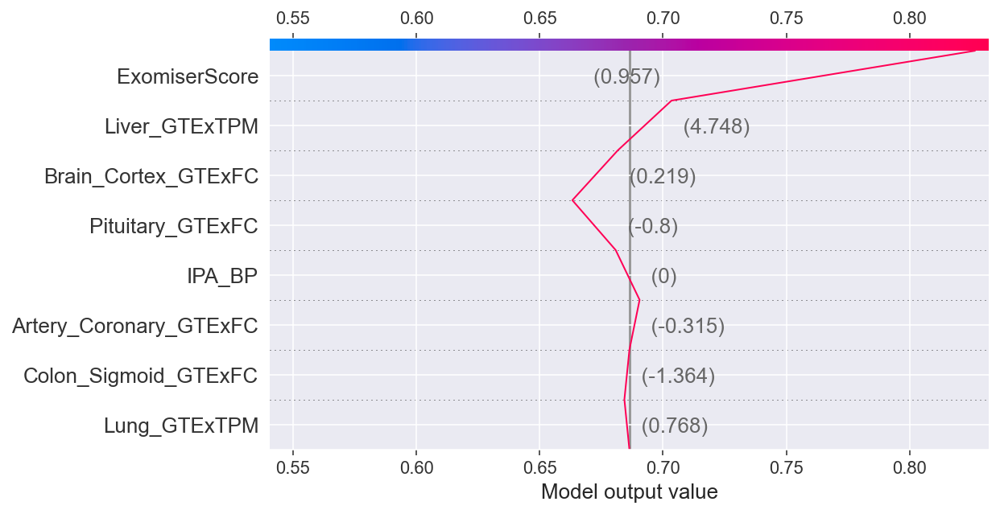

In [84]:
explainer = shap.TreeExplainer(model)

expected_value = explainer.expected_value
select = range(8)
features = X2.iloc[select]
features_display = X2.loc[features.index]
shap_values = explainer.shap_values(X2)
shap.decision_plot(
    expected_value, shap_values[1561], X2.iloc[1561], list(features_display)
)